### Version of use package: 
1. pandas version: 1.0.1
2. mne version: 0.20.6 
3. numpy version:  1.18.1
4. matplotlib version:  3.1.3

### Data
1. Please load csv file: shiyang/minjiun/pinhan/yalin/chihheng.csv into this ipynb.  
2. ~~event_marker.csv: used for identifying category of image. ~~
3. GoNogoList_PA.xlsx: correct event marker file. (35 cats+ 325 noncats) 0: cat, 1: noncat 

## Loading data into ipynb
1. dataloader
2. ChangeEventID
3. mneLoadIn
    1. Load events in mne [done]   
        + original event=1(stimulus, picture showing(every animal)),event=2(response, onclick)  
        + define target: cat didnot click & noncat click, nontarget: cat click & noncat didnot click for ERP & ERN  
    https://mne.tools/stable/auto_tutorials/preprocessing/plot_20_rejecting_bad_data.html#sphx-glr-auto-tutorials-preprocessing-plot-20-rejecting-bad-data-py  
        + Odd-ball paradism: cat v.s. noncat (don't care about correct or incorrect actions)
    Total number of Image: 360, *the last 1 in subject csv doesn't recorded in event_marker.csv!*  
    *Change event type: 0: nan, 1: cat image, 2: noncat image, 3: click*  
    Unit of EEG data in csv: $\mu V$, Unit of EEG data in mne: $V$ -> all EEG channel need to be divided 10^6.  
        + Need to extract target and nontarget

## Analysis procedure
https://imotions.com/blog/5-basics-eeg-data-processing/
1. Downsampling: 500->256 Hz https://mne.tools/stable/auto_examples/preprocessing/plot_resample.html  
2. Re-reference  https://mne.tools/dev/auto_examples/preprocessing/plot_rereference_eeg.html#sphx-glr-auto-examples-preprocessing-plot-rereference-eeg-py [done] 
3. Centering [done]
4. Extract epochs: [-0.2,1] with baseline removal [done]  
5. Artifact Removal: 
    + By amplitude [done]
    + By ICA: https://mne.tools/stable/auto_tutorials/preprocessing/plot_40_artifact_correction_ica.html [not yet] 
    + (t)SSS [not yet]  
    + SSP [not yet]  
    + OTP
6. Plot ICA components [montage issue] : use montage file from Monchun. [done]   
https://mne.tools/stable/generated/mne.channels.read_custom_montage.html#mne.channels.read_custom_montage  
7. Plot PSD (Optional) [done] 
8. Plot ERP/ERN: https://mne.tools/0.16/auto_tutorials/plot_eeg_erp.html  [not yet]   
9. Time Frequency spectrogram (before average) [not yet]

## ToDo List
1. plot 1 line erp for target and nontarget
2. Reconstruct bad component by other compoenets in ICA
3. Extract epochs after ICA 
3. Time Frequency spectrogram (before average) [not yet]

In [11]:
# (Optional) Upgrade mne
!pip install -U mne

     |████████████████████████████████| 6.6 MB 1.2 MB/s eta 0:00:01
  Attempting uninstall: mne
    Found existing installation: mne 0.19.2
    Uninstalling mne-0.19.2:
      Successfully uninstalled mne-0.19.2


What is Serial Number in csv?

In [1]:
import pandas as pd
import mne 
from mne.preprocessing import ICA
from mne.channels import read_custom_montage
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
%pylab notebook

Populating the interactive namespace from numpy and matplotlib


In [2]:
print('pandas version: ',pd.__version__)
print('mne version: ',mne.__version__)
print('numpy version: ',np.__version__)
import matplotlib
print('matplotlib version: ',matplotlib.__version__)

pandas version:  1.0.1
mne version:  0.20.6
numpy version:  1.18.1
matplotlib version:  3.1.3


In [3]:
'''
dataloader:  A function used for loading csv data.
===================================================================================================
Input variable(s):
subject_file: Directory of EEG data(deleted Meta Info) of subject in csv. (in default directory)
===================================================================================================
Output:
data: subject data without EEG data after the end of session.
'''
def dataloader(subject_file):
    # Step 1: Load EEG data (32 sensor channels and 1 STIM channel(Software Marker)) 
    column_use=[i for i in range(2,34)]
    column_use.append(37)
    data=pd.read_csv(subject_file,usecols=column_use, skiprows=10)#
    return data

In [4]:
folder='raw_data/'
data=dataloader(folder+'minjiun_150901.csv')
event=pd.read_excel('GoNogoList_PA.xlsx',header=None)

In [5]:
data.index[data['Software Marker'] == 1]

Int64Index([  3104,   3606,   4110,   4613,   5116,   5620,   6120,   6623,
              7126,   7630,
            ...
            414145, 415149, 416152, 417155, 418158, 419162, 420165, 421168,
            422172, 423175],
           dtype='int64', length=360)

In [6]:
'''
new_ChangeEventID: A function used for modifying event ID of cat images, noncat images, and clicks in subject data. 
=================================================================================================================
Input variable(s):
event: GoNogoList_PA csv file, which records image category (0: cat, 1: noncat).
data: subject data that contains event ID (Software Marker) ( nan, 1: (cat or noncat) image show, 2: click)
=================================================================================================================
Output:
data: subject data with redefined event ID (Software Marker) ( 0:nan, 1:cat image show, 2: noncat image show, 3: click )
=================================================================================================================
Notice: 
1. If image number of data is not equal to image number of event, ChangeEventID just returns original data.
2. If index of cat image(in list of all image) in data is not equal to index of cat image(in list of all image) in event marker,
   ChangeEventID just returns original data.
'''
def new_ChangeEventID(event,data):
    
    # Step 0: check if image number in data is same as image number in event
    # l_data: index list of all images in data (len(l_data)=360, range(cat_index)=[0,1.,...,len(data)])
    l_data=data.index[data['Software Marker'] == 1]#.tolist()
    if len(l_data)!=len(event):
        print('Image number of data is not equal to image number of event!')
        return data
    else: print('Changing event ID of data ... ...')
    
    # Step 1: Convert nan into 0 in Software Marker column of data
    data['Software Marker'].fillna(0, inplace=True)
    #         Convert 2 into 3 in Software Marker column of data
    data['Software Marker'].replace({2:3},inplace=True)
    #         Convert 1 into 2 in Software Marker column of data
    data['Software Marker'].replace({1:2},inplace=True)
    
    # Step 2: Find index of cat image in data, and convert 2 into 1 for cells w.r.t. these indices
    filter=event[0]==0
    # cat_event_marker: index list of cat image in all images (len(cat_event_marker)=35, range(cat_event_marker)=[0,1.,...,359])
    cat_event_marker=event.index[filter].tolist()
    for i in cat_event_marker:# l_data[i]: real index in data
        data.at[l_data[i],'Software Marker']=1
    
    # Step 3: check if the conversion of event ID for cat image is correct or not
    data_index=data[(data['Software Marker']==1)|(data['Software Marker']==2)].reset_index()
    # data_index=data_index.reset_index()
    data_index=data_index.index[data_index['Software Marker']==1].tolist()
    if cat_event_marker!=data_index:
        print('Fail to convert event ID!')
        return data
    else: print('Finish index checking!')
    return data

In [7]:
new_data=new_ChangeEventID(event,data)

Changing event ID of data ... ...
Finish index checking!


1. Delete bad Epoch: https://mne.tools/stable/generated/mne.Epochs.html
2. Epoch basic: https://mne.tools/0.16/auto_tutorials/plot_epoching_and_averaging.html#tut-epoching-and-averaging

In [8]:
new_data.columns

Index(['Fp1', 'Fp2', 'AF3', 'AF4', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3',
       'FCz', 'FC4', 'FT8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP7', 'CP3', 'CPz',
       'CP4', 'TP8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2',
       'Software Marker'],
      dtype='object')

In [9]:
'''
mneLoadIn: A function used for loading cleaned EEG data into mne. 
=================================================================================================================
Input variable(s):
new_data: subject data with redefined event ID (Software Marker) ( 0:nan, 1:cat image show, 2: noncat image show, 3: click )
=================================================================================================================
Output:
raw: mne.io.RawArray (EEG data with Info).
events: 3D np.array (TimestampIndex, 0, event ID)
epochs: mne.Epochs with baseline removal and artifact removal (by amplitude)
=================================================================================================================
Notice: 
1. Unsolved montage issue results in failure of plotting ICA components in topography.
2. Preprocessing (Bandpass filtering, Find Event, and Extract Epoch) procedure is fixed in this version.
'''
def mneLoadIn(new_data,loc_fname):
    
    l=len(new_data.T)
    # Step 1: Change unit of data (mu V-> V) except stim channel
    for ch in range(l-1): # l-1: last channel is stim channel
        new_data.T.iloc[ch,:]=new_data.T.iloc[ch,:]/10**6
        
    # Step 2: Create RawArray in mne
    # ch_names: Name list of channels
    ch_names = list(new_data.T.index)  
    # sfreq: Sampling rate of the EEG data in Hz
    sfreq = 500  
    ch_types=['eeg' for i in range(32)]
    ch_types.append('stim')
    dig_montage = read_custom_montage(loc_fname, coord_frame='head')# ,head_size=None
    # Create the info structure needed by MNE
    info = mne.create_info(ch_names, sfreq, ch_types)# , montage=montage
    info.set_montage(dig_montage)#'biosemi32'
    # Create the Raw object
    raw = mne.io.RawArray(new_data.T.values, info,copy='info')
    print('Plot raw EEG data!')
    raw.plot()
    
    # Step 3: preprocessing 
    #       Downsampling
    print('Downsampling... ...')
    print('Original sfreq:',raw.info['sfreq'])
    raw=raw.resample(256, npad='auto')
    print('sfreq after downsampling:',raw.info['sfreq'])
    #         Re-reference
    print('Re-reference... ...')
    raw.set_eeg_reference()# ref_channels='average',ch_type='eeg'
    #         Centering
    print('Centering... ...')
    for ch in range(l-1): # l-1: last channel is stim channel
        raw._data[ch,:]=raw._data[ch,:]-np.mean(raw._data[ch,:])
    #         Bandpass filtering [1,40] Hz
    print('Bandpass filtering... ...')
    h_freq=51.2
    iir_params = dict(order=5, ftype='butter')#, output='sos'
    raw=raw.filter(1, h_freq, method='fir',picks=np.arange(32))# ,iir_params=iir_params
    print('Plot EEG data after bandpass [1,{}] Hz!'.format(h_freq))
    raw.plot()
    
    #         Find events in EEG data
    events = mne.find_events(raw)
    print('Plot EEG data with events!')
    raw.plot(events=events)
    print('Start to extract epochs with artifact removal.')
    #        Extract Epoch with baseline removal and artifact removal (by amplitude).
    reject_criteria = dict(eeg=200e-6) # max amplitude:200 µV
    flat_criteria = dict(eeg=1e-6) # min amplitude:1 µV
    # baseline: start from -0.2(s) and end to 0(s) before start of stimulus 
    baseline=(-0.2,0)
    epochs = mne.Epochs(raw, events, event_id=[1,2], tmin=-0.2, tmax=1, baseline=baseline,
                        reject=reject_criteria,picks=np.arange(32),proj='delayed')#, flat=flat_criteria
    print('Plot epochs!')
    epochs.plot(block=True)
    return raw, events, epochs

Creating RawArray with float64 data, n_channels=33, n_times=427600
    Range : 0 ... 427599 =      0.000 ...   855.198 secs
Ready.
Plot raw EEG data!


<IPython.core.display.Javascript object>


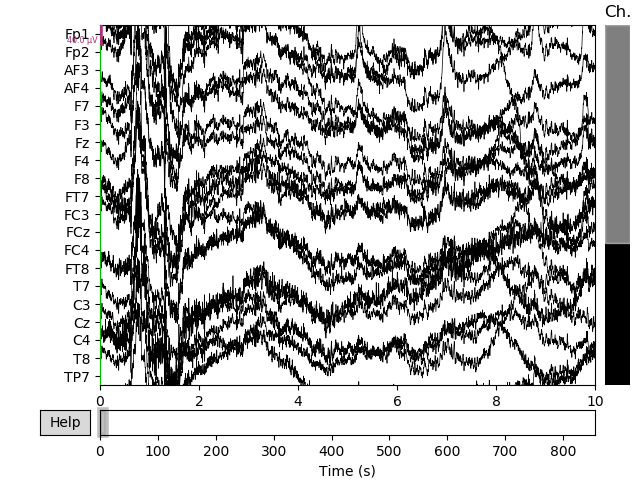

Downsampling... ...
Original sfreq: 500.0
835 events found
Event IDs: [1 2 3]
835 events found
Event IDs: [1 2 3]
sfreq after downsampling: 256.0
Re-reference... ...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom EEG reference.
Centering... ...
Bandpass filtering... ...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 51.20 Hz
- Upper transition bandwidth: 12.80 Hz (-6 dB cutoff frequency: 57.60 Hz)
- Filter length: 845 samples (3.301 sec)

Plot EEG data after bandpass [1,51.2] Hz!


<IPython.core.display.Javascript object>


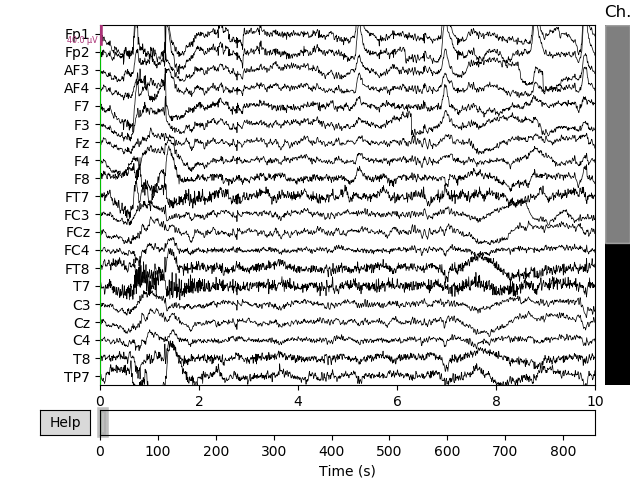

835 events found
Event IDs: [1 2 3]
Plot EEG data with events!


<IPython.core.display.Javascript object>


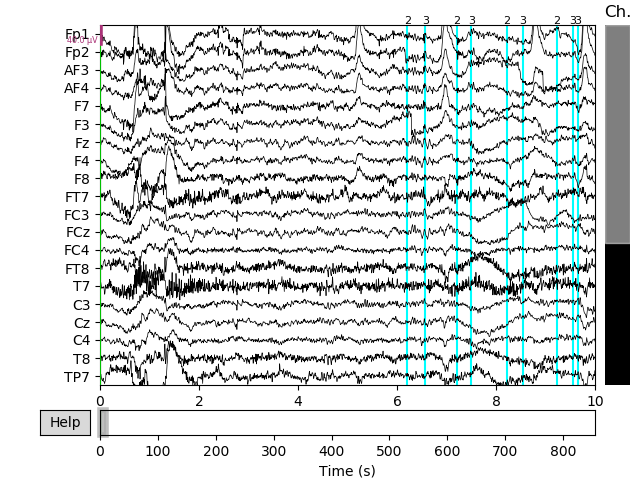

Start to extract epochs with artifact removal.
360 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
Entering delayed SSP mode.
Plot epochs!
Loading data for 360 events and 308 original time points ...
    Rejecting  epoch based on EEG : ['CP4']
    Rejecting  epoch based on EEG : ['CP4']
    Rejecting  epoch based on EEG : ['O2']
    Rejecting  epoch based on EEG : ['Pz', 'O1', 'Oz', 'O2']
    Rejecting  epoch based on EEG : ['Oz', 'O2']
    Rejecting  epoch based on EEG : ['O2']
    Rejecting  epoch based on EEG : ['O2']
    Rejecting  epoch based on EEG : ['O2']
    Rejecting  epoch based on EEG : ['O1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
12 bad epochs dropped
Loading data for 348 events and 308 original time points ...


<IPython.core.display.Javascript object>


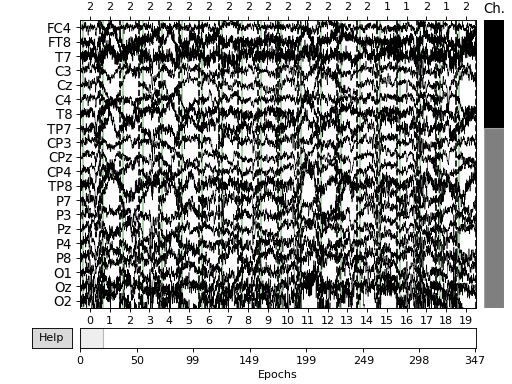

Loading data for 20 events and 308 original time points ...


In [10]:
raw, events, epochs=mneLoadIn(new_data,'32.loc')

### high variance

In [15]:
epochs

<Epochs  |   348 events (all good), -0.199219 - 1 sec, baseline [-0.2, 0], ~91 kB, data not loaded,
 '1': 33
 '2': 315>

In [14]:
epochs.get_data().shape

Loading data for 348 events and 308 original time points ...


(348, 32, 308)

In [17]:
epochs.events[:,-1]

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2,
       2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2,

In [16]:
raw._data

array([[ 5.16690098e-20, -6.76041116e-06, -8.69021393e-06, ...,
        -5.90868963e-06, -4.87637280e-06,  8.13151629e-20],
       [ 2.87991202e-20, -6.57733675e-06, -8.22783795e-06, ...,
        -1.53510234e-05, -1.02003372e-05, -3.30342849e-20],
       [-1.20278679e-19, -6.37870313e-06, -8.83856160e-06, ...,
        -9.30065973e-06, -6.85097650e-06,  2.24463731e-20],
       ...,
       [ 5.98746415e-20,  1.16122628e-05,  1.60953850e-05, ...,
         1.07857405e-05,  5.82074204e-06,  6.14098887e-21],
       [-3.04931861e-19,  1.51026975e-05,  2.09357730e-05, ...,
         7.98550375e-06,  4.02464503e-06,  4.21398891e-20],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

Creating RawArray with float64 data, n_channels=32, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


<IPython.core.display.Javascript object>


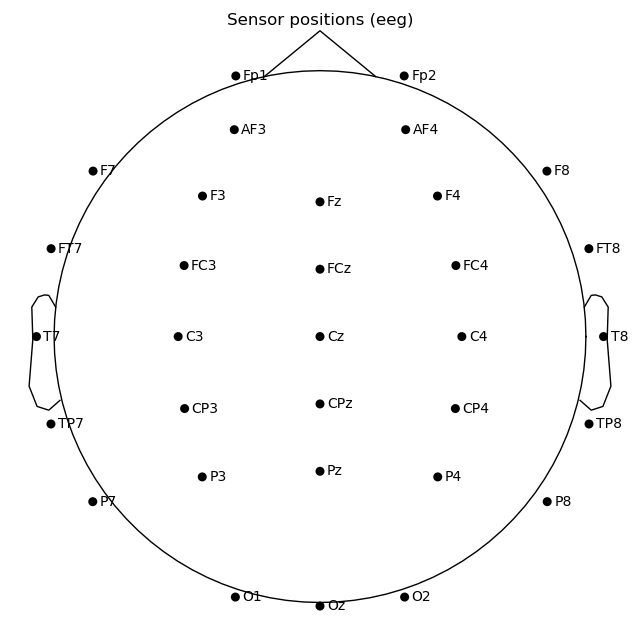

<IPython.core.display.Javascript object>


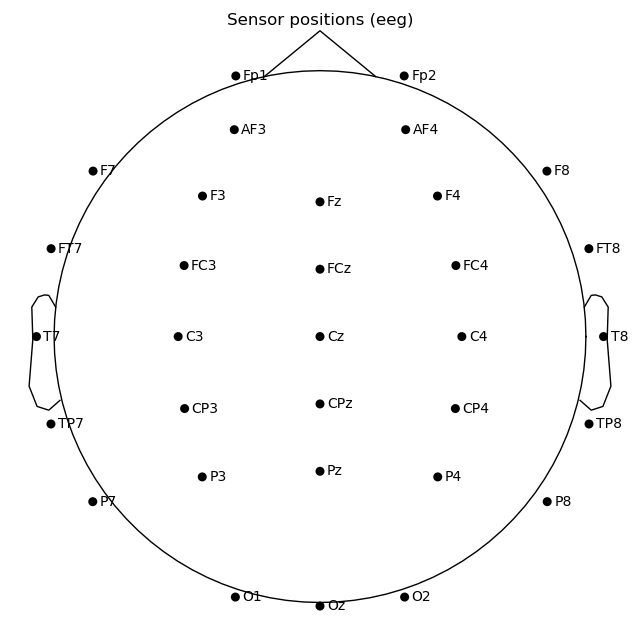

In [11]:
# load montage file provided by monchun
montage_file='32.loc'#.ced
dig_montage = read_custom_montage(montage_file, coord_frame='head')# ,head_size=None
dig_montage.plot()

In [12]:
raw._data.shape

(33, 218931)

The events list contains three columns.  
The first column corresponds to sample number.  
To convert this to seconds, you should divide the sample number by the used sampling frequency.  
The second column is reserved for the old value of the trigger channel at the time of transition, but is currently not in use.  The third column is the trigger id (amplitude of the pulse).

In [13]:
events

array([[  1589,      0,      2],
       [  1683,      0,      3],
       [  1846,      0,      2],
       ...,
       [216152,      0,      2],
       [216248,      0,      3],
       [216665,      0,      2]])

In [14]:
epochs.info

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, AF3, AF4, F7, F3, Fz, F4, F8, FT7, FC3, FCz, FC4, FT8, ...
 chs: 32 EEG
 custom_ref_applied: True
 dig: 32 items (32 EEG)
 highpass: 1.0 Hz
 lowpass: 51.2 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 256.0 Hz
>

### Solved issue: Montage

Deal with montage: https://mne.tools/dev/auto_tutorials/intro/plot_40_sensor_locations.html#sphx-glr-auto-tutorials-intro-plot-40-sensor-locations-py

Creating RawArray with float64 data, n_channels=32, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


<IPython.core.display.Javascript object>


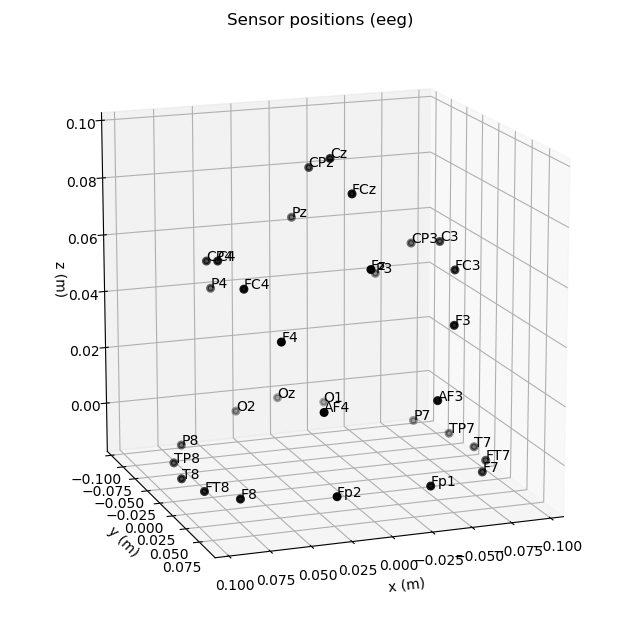

Creating RawArray with float64 data, n_channels=32, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


<IPython.core.display.Javascript object>


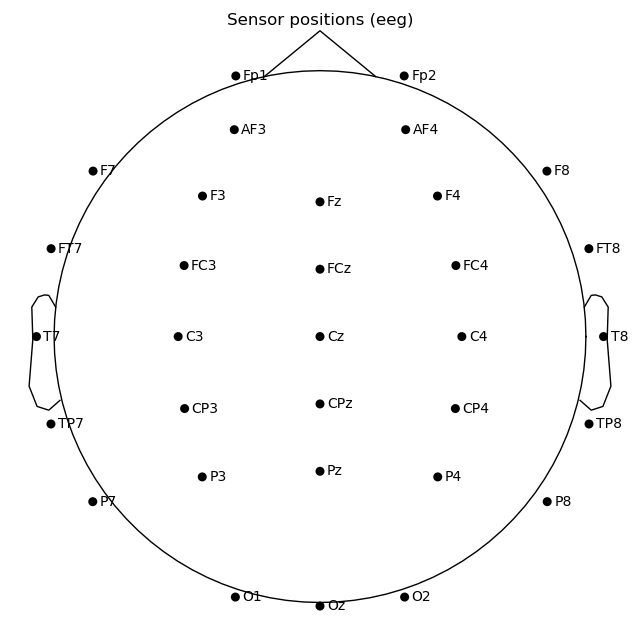

<IPython.core.display.Javascript object>


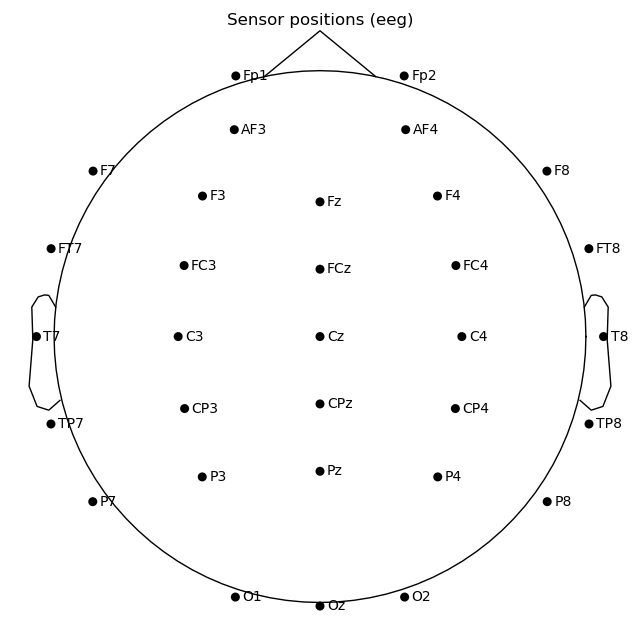

In [15]:
fig = dig_montage.plot(kind='3d')
fig.gca().view_init(azim=70, elev=15)
dig_montage.plot(kind='topomap', show_names=True)

In [16]:
ica = ICA(n_components=32, random_state=97)

## ICA components of raw data

In [17]:
ica.fit(raw)# epochs

Fitting ICA to data using 32 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 32 components
Fitting ICA took 7.2s.


<ICA  |  raw data decomposition, fit (fastica): 218931 samples, 32 components, channels used: "eeg">

In [18]:
ica.detect_artifacts(raw)

    Searching for artifacts...
    found 1 artifact by skewness
    found 1 artifact by kurtosis
    found 1 artifact by variance
Artifact indices found:
    14, 1, 0
Ready.


<ICA  |  raw data decomposition, fit (fastica): 218931 samples, 32 components, channels used: "eeg", 3 sources marked for exclusion>

<IPython.core.display.Javascript object>


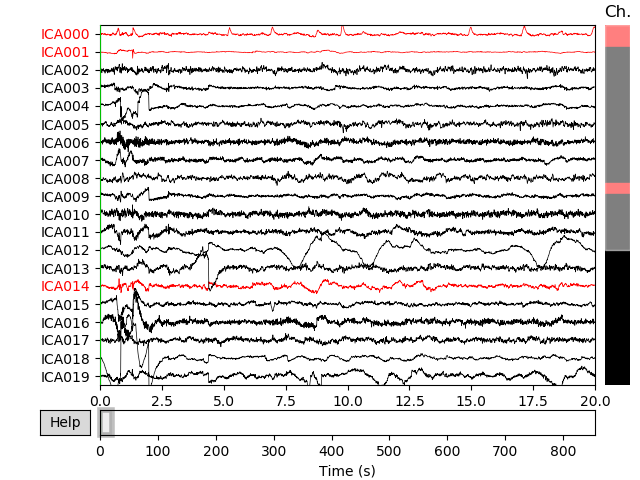

<IPython.core.display.Javascript object>


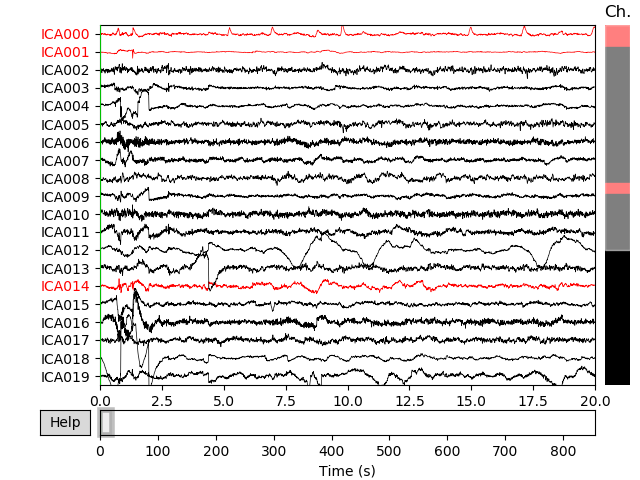

In [19]:
raw.load_data()
ica.plot_sources(raw)

為什麼趨勢斜斜的

<IPython.core.display.Javascript object>


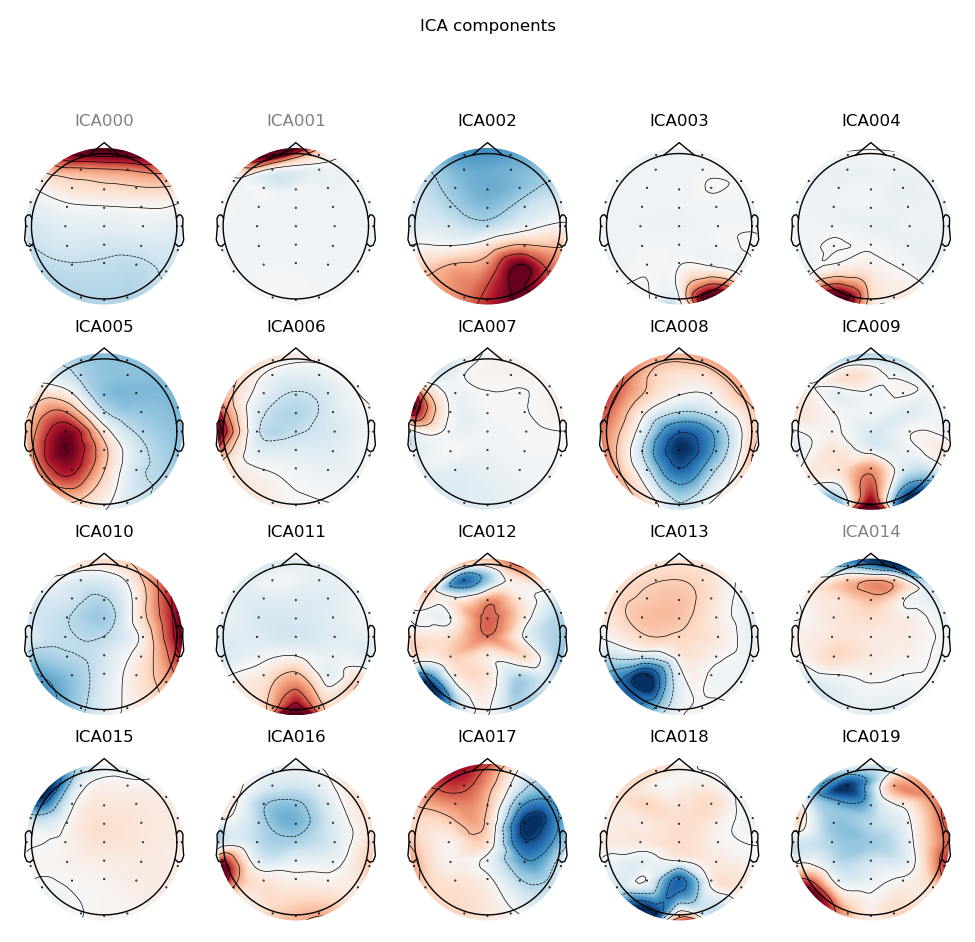

<IPython.core.display.Javascript object>


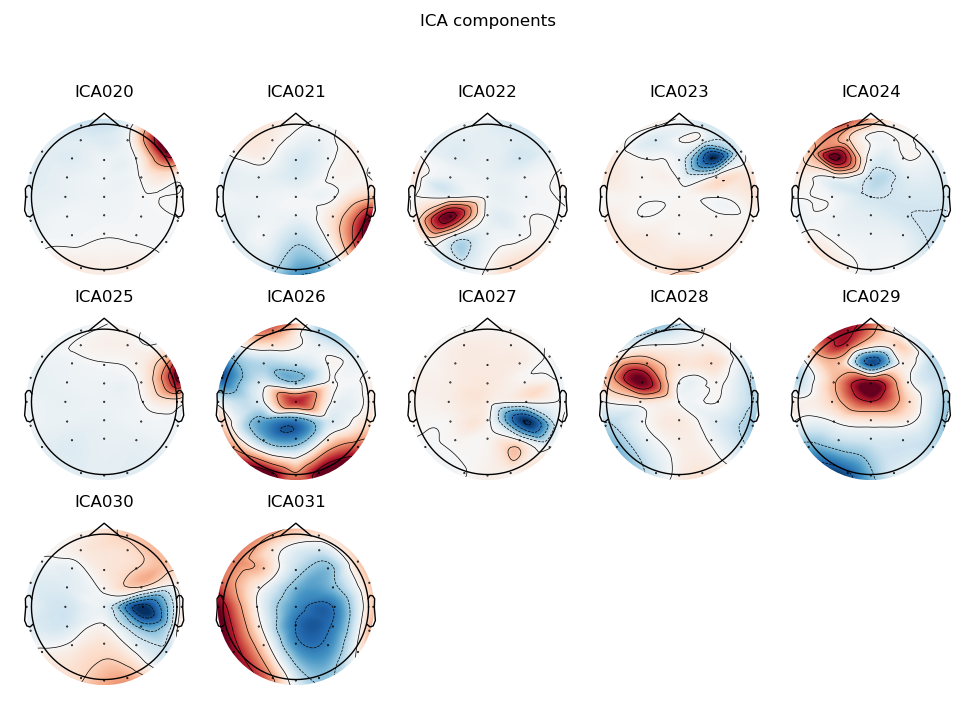

[<Figure size 975x942 with 20 Axes>, <Figure size 975x706.5 with 12 Axes>]

In [20]:
ica.plot_components()

In [21]:
ica.exclude = [0,1,14]
# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw.copy()
ica.apply(reconst_raw)

Transforming to ICA space (32 components)
Zeroing out 3 ICA components


<RawArray | 33 x 218931 (855.2 s), ~55.2 MB, data loaded>

<IPython.core.display.Javascript object>


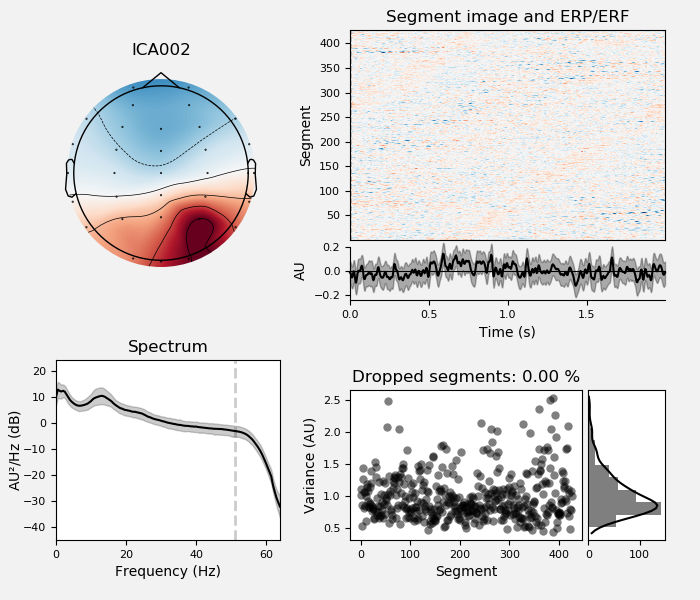

    Using multitaper spectrum estimation with 7 DPSS windows
427 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


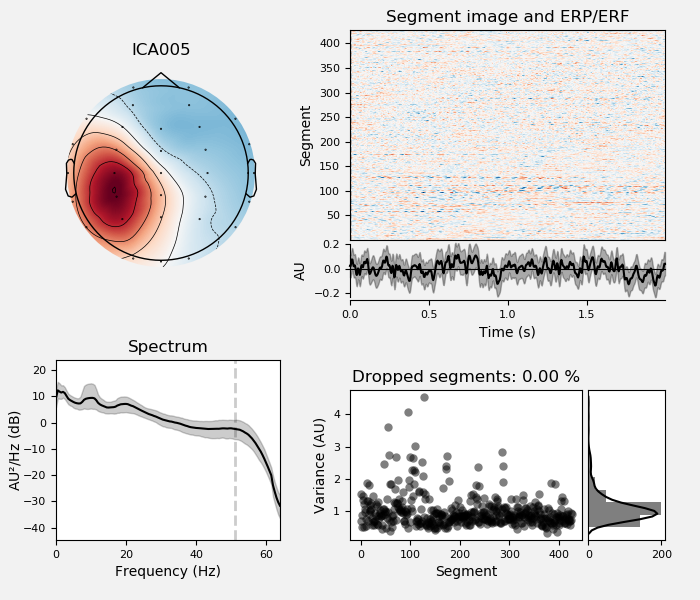

427 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


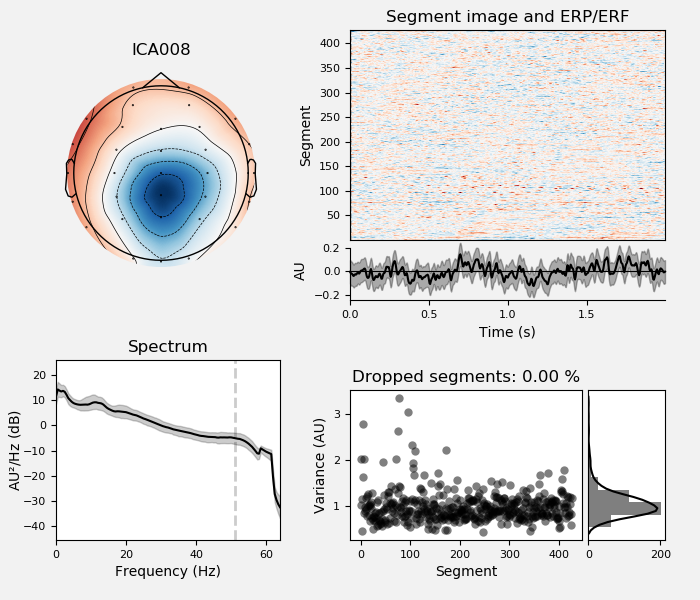

427 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [22]:
ica.plot_properties(raw, picks=[2,5,8])

## ICA of components of epochs

In [23]:
ica.fit(epochs)# epochs

Fitting ICA to data using 32 channels (please be patient, this may take a while)
Loading data for 348 events and 308 original time points ...
Selecting by number: 32 components
Loading data for 348 events and 308 original time points ...
Fitting ICA took 5.9s.


<ICA  |  epochs decomposition, fit (fastica): 107184 samples, 32 components, channels used: "eeg", 3 sources marked for exclusion>

In [24]:
ica.detect_artifacts(epochs)

    Searching for artifacts...
Loading data for 348 events and 308 original time points ...
    found 1 artifact by skewness
Loading data for 348 events and 308 original time points ...
    found 1 artifact by kurtosis
Loading data for 348 events and 308 original time points ...
    found 1 artifact by variance
Artifact indices found:
    20, 26, 12, 22, 22, 0
    Removing duplicate indices...
Ready.


<ICA  |  epochs decomposition, fit (fastica): 107184 samples, 32 components, channels used: "eeg", 5 sources marked for exclusion>

Loading data for 348 events and 308 original time points ...


<IPython.core.display.Javascript object>


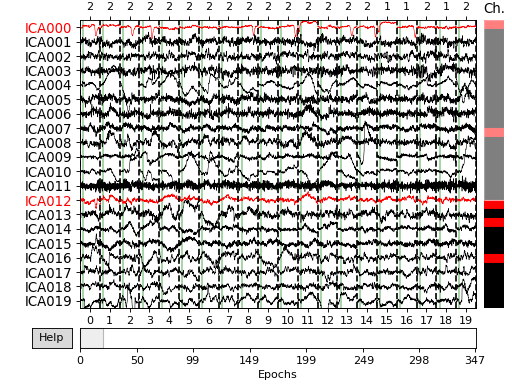

<IPython.core.display.Javascript object>


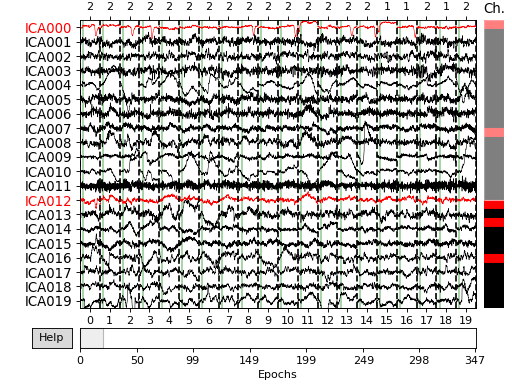

In [25]:
epochs.load_data()
ica.plot_sources(epochs)

<IPython.core.display.Javascript object>


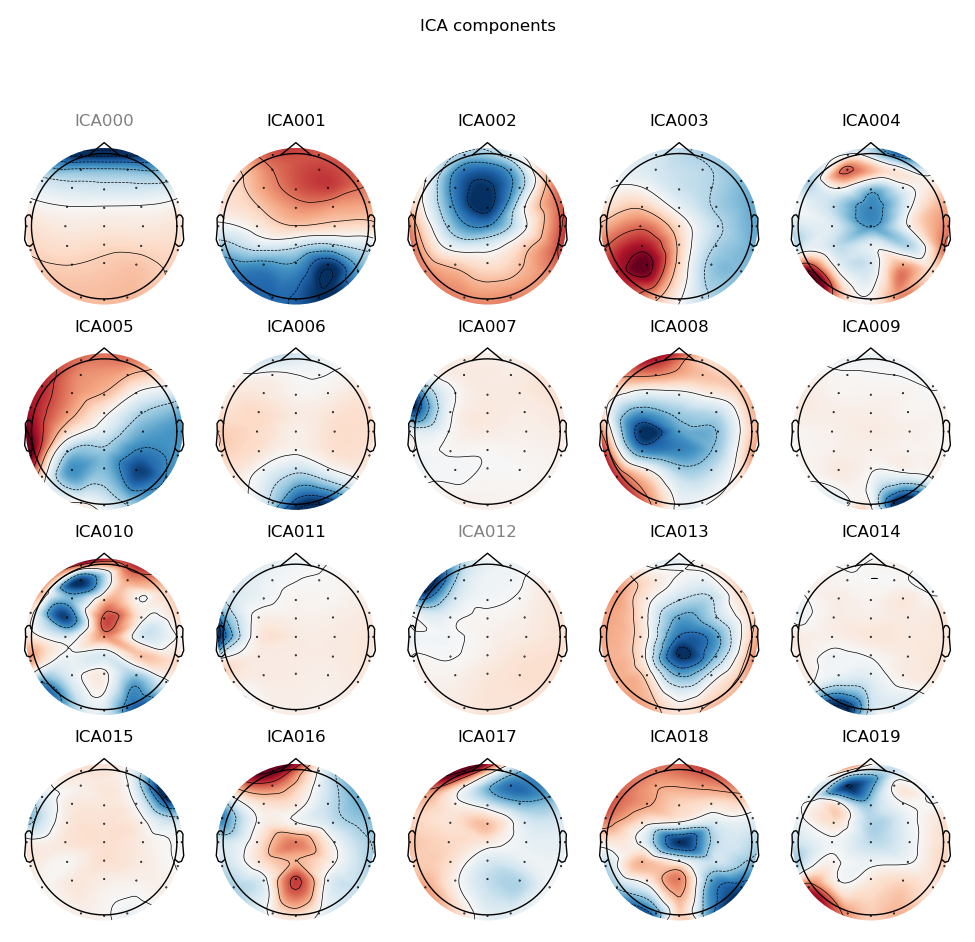

<IPython.core.display.Javascript object>


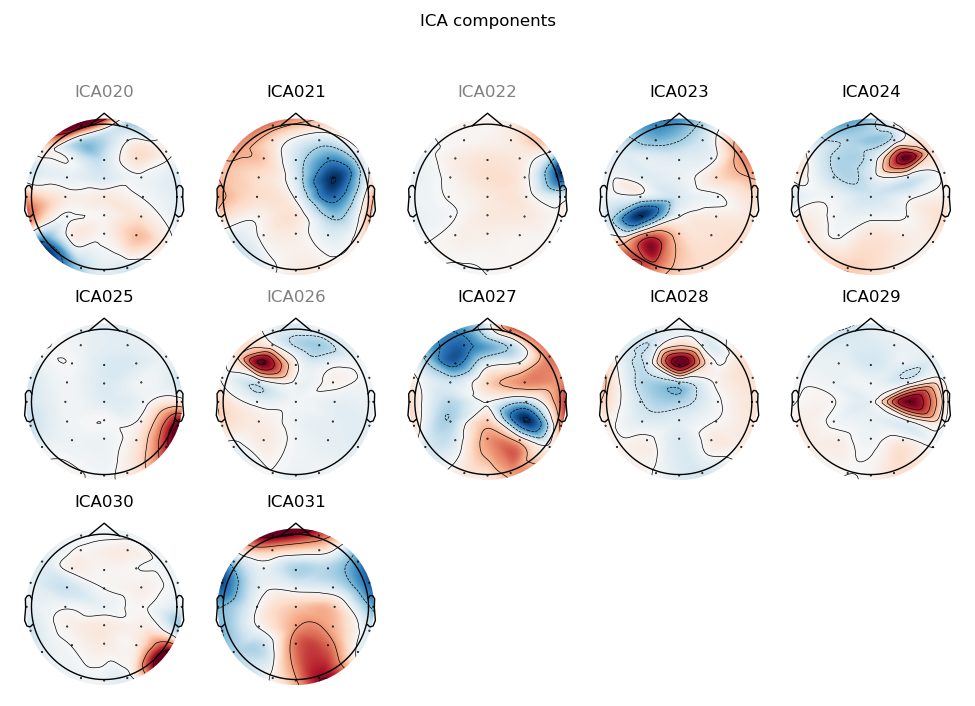

[<Figure size 975x942 with 20 Axes>, <Figure size 975x706.5 with 12 Axes>]

In [26]:
ica.plot_components()

In [27]:
ica.exclude = [0,12,20,22,26]
# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_epochs = epochs.copy()
ica.apply(reconst_epochs)

Transforming to ICA space (32 components)
Zeroing out 5 ICA components


<Epochs  |   348 events (all good), -0.199219 - 1 sec, baseline [-0.2, 0], ~26.3 MB, data loaded,
 '1': 33
 '2': 315>

https://mne.tools/dev/auto_examples/preprocessing/plot_run_ica.html

<IPython.core.display.Javascript object>


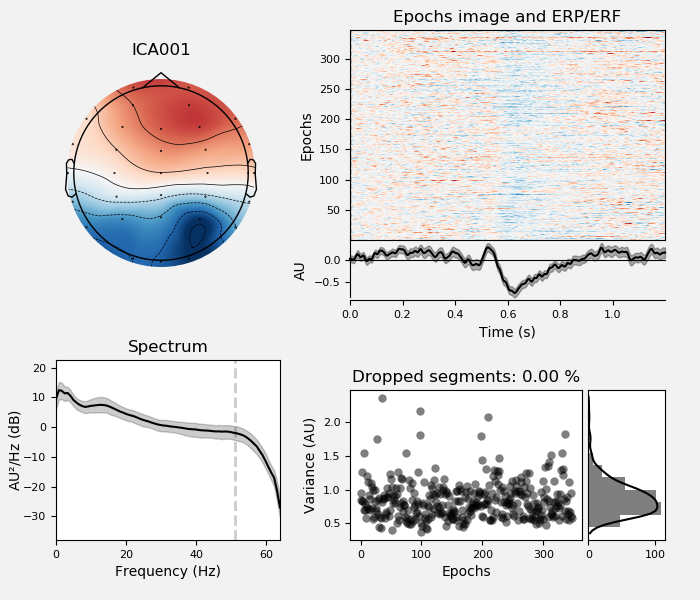

    Using multitaper spectrum estimation with 7 DPSS windows
348 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


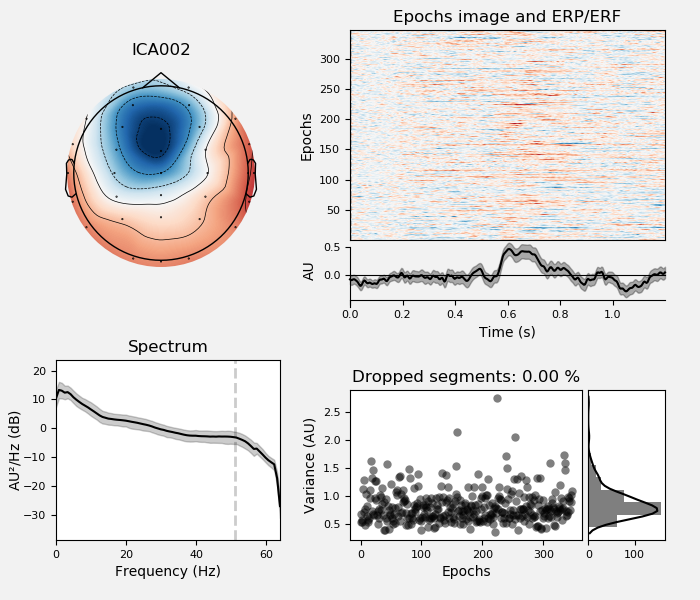

348 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


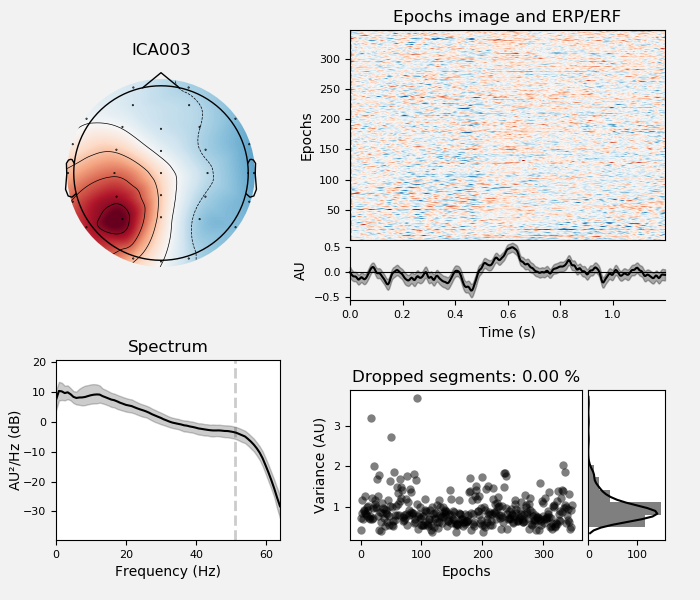

348 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


<IPython.core.display.Javascript object>


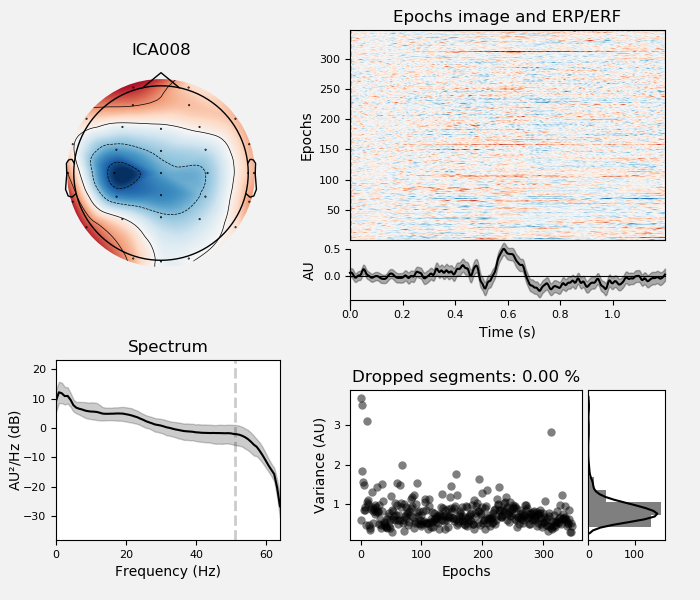

348 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/ica.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


<IPython.core.display.Javascript object>


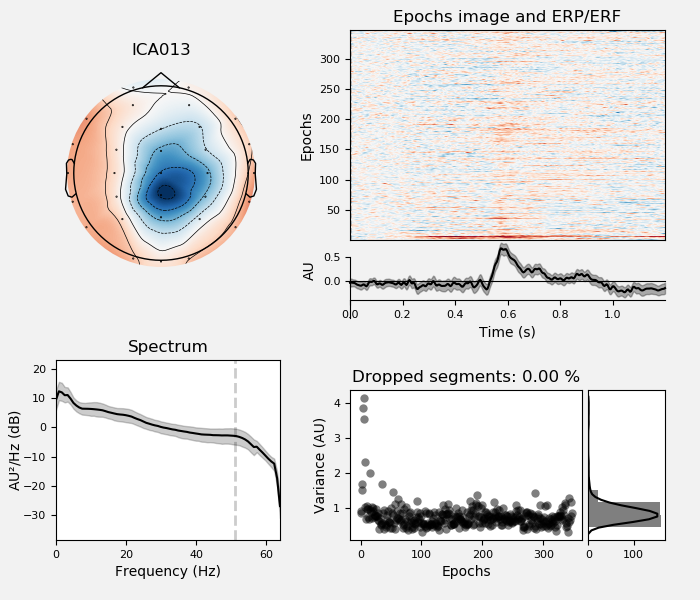

348 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [29]:
ica.plot_properties(epochs, picks=[1,2,3,8,13])

https://mne.tools/dev/auto_examples/time_frequency/plot_compute_raw_data_spectrum.html#sphx-glr-auto-examples-time-frequency-plot-compute-raw-data-spectrum-py

## ERP
https://mne.tools/stable/auto_tutorials/evoked/plot_eeg_erp.html?highlight=erp#setting-eeg-reference
### Be discussed
https://mne.tools/dev/auto_examples/visualization/plot_roi_erpimage_by_rt.html#sphx-glr-auto-examples-visualization-plot-roi-erpimage-by-rt-py  
https://mne.tools/dev/generated/mne.Epochs.html#mne.Epochs.plot_image  
Plot Event Related Potential / Fields image.

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/epochs.py:397: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  this_fig = figure()


<IPython.core.display.Javascript object>


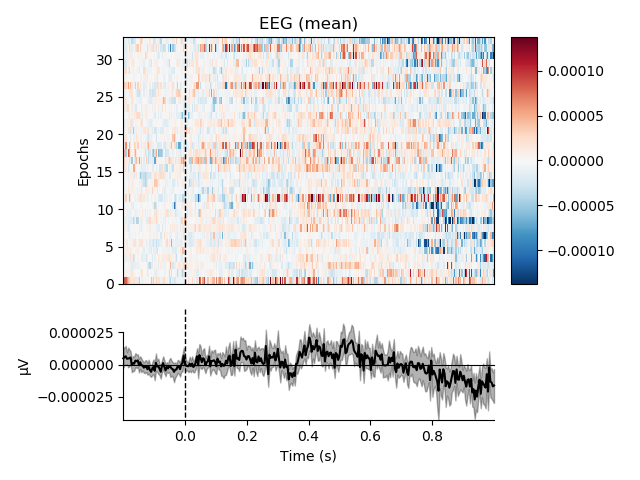

33 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
combining channels using "mean"


[<Figure size 640x480 with 3 Axes>]

In [30]:
reconst_epochs['1'].plot_image(picks='eeg',combine='mean')# ,combine='mean'

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/epochs.py:397: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  this_fig = figure()


<IPython.core.display.Javascript object>


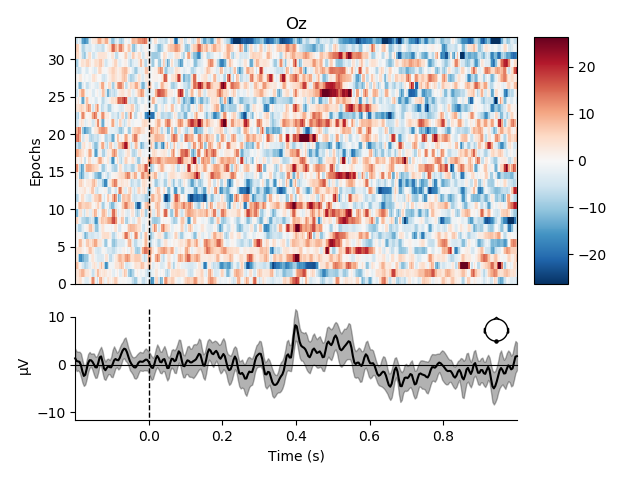

33 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


[<Figure size 640x480 with 4 Axes>]

In [38]:
reconst_epochs['1'].plot_image(picks='Oz')

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/epochs.py:397: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  this_fig = figure()


<IPython.core.display.Javascript object>


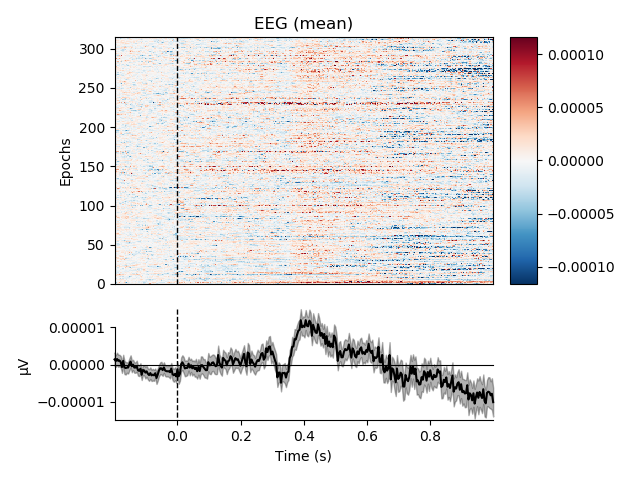

315 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
combining channels using "mean"


[<Figure size 640x480 with 3 Axes>]

In [39]:
reconst_epochs['2'].plot_image(picks='eeg',combine='mean')# , 

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/epochs.py:397: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  this_fig = figure()


<IPython.core.display.Javascript object>


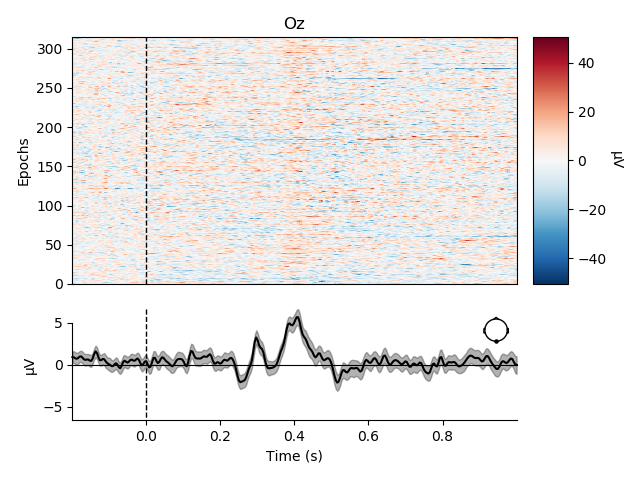

315 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


[<Figure size 640x480 with 4 Axes>]

In [40]:
reconst_epochs['2'].plot_image(picks='Oz')

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


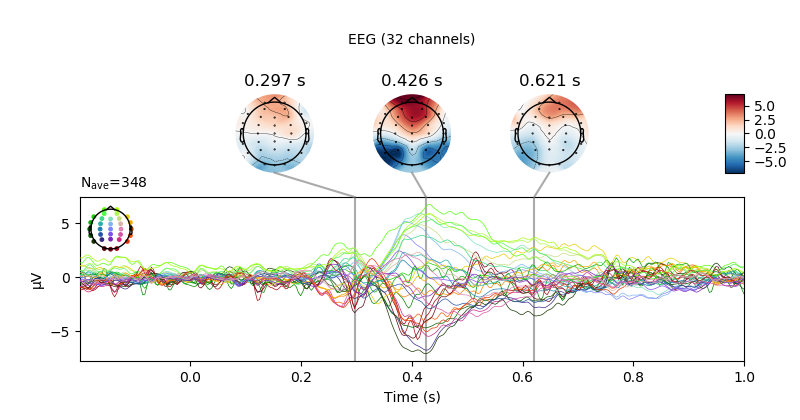

<IPython.core.display.Javascript object>


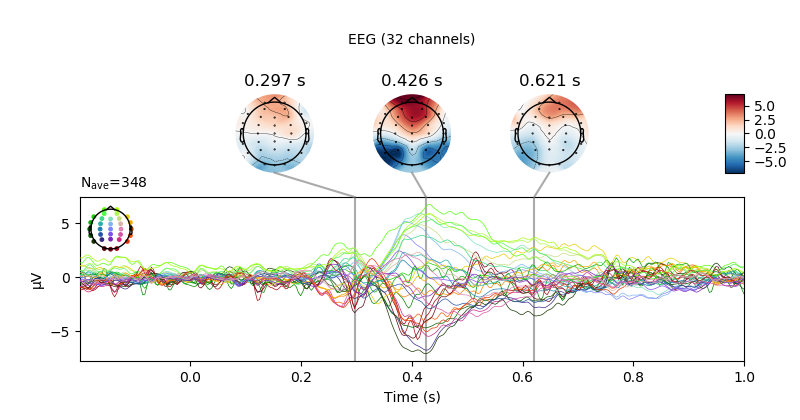

In [41]:
cat, noncat = reconst_epochs["1"].average(), reconst_epochs["2"].average()
# create and plot difference ERP
joint_kwargs = dict(ts_args=dict(time_unit='s'),
                    topomap_args=dict(time_unit='s'))
mne.combine_evoked([cat, -noncat], weights='nave').plot_joint(**joint_kwargs)

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


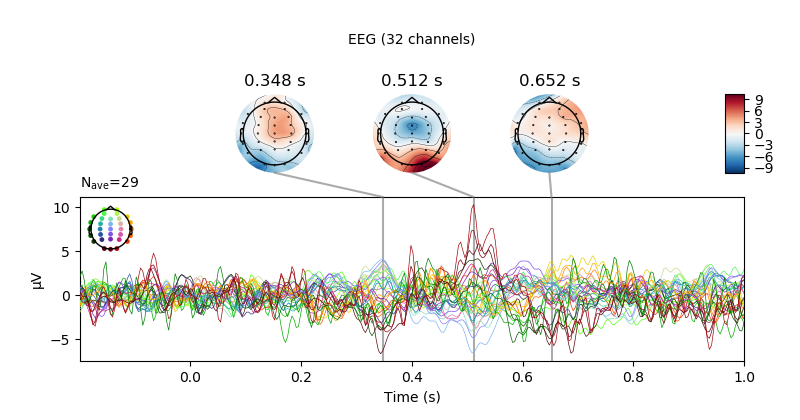

<IPython.core.display.Javascript object>


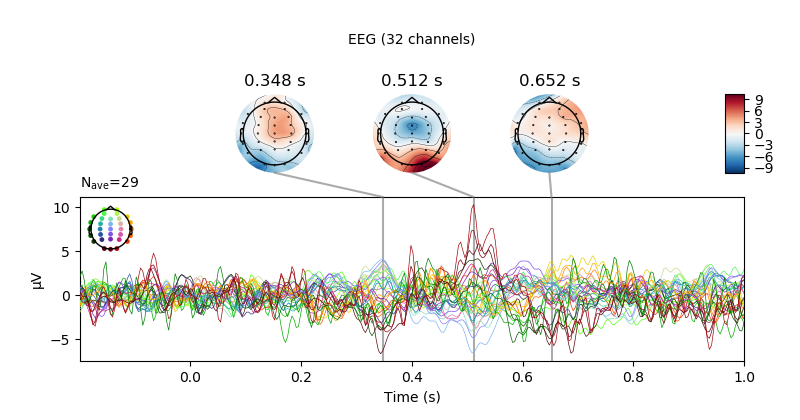

In [42]:
# Then, we construct and plot an unweighted average of cat vs. noncat trials
# this way, too:
mne.combine_evoked([cat, -noncat], weights='equal').plot_joint(**joint_kwargs)

 If you have imbalanced trial numbers, you could also consider either equalizing the number of events per condition (using epochs.equalize_event_counts). As an example, first, we create individual ERPs for each condition.

In [43]:
all_evokeds = [cat,noncat]
print(all_evokeds)

[<Evoked  |  '1' (average, N=33), [-0.19922, 1] sec, 32 ch, ~168 kB>, <Evoked  |  '2' (average, N=315), [-0.19922, 1] sec, 32 ch, ~168 kB>]


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


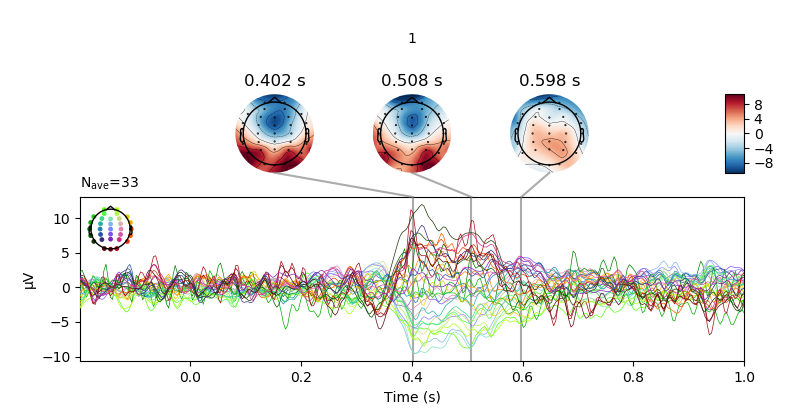

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


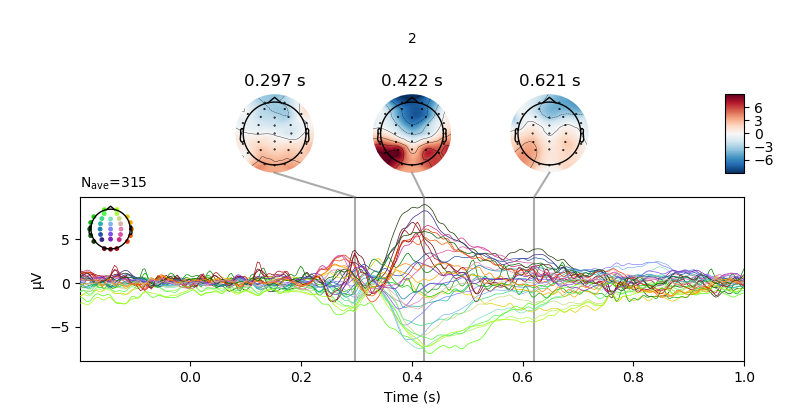

In [44]:
# Besides for explicit access, this can be used for example to set titles.
for cond in [0,1]:
    all_evokeds[cond].plot_joint(title=cond+1)#, **joint_kwargs

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


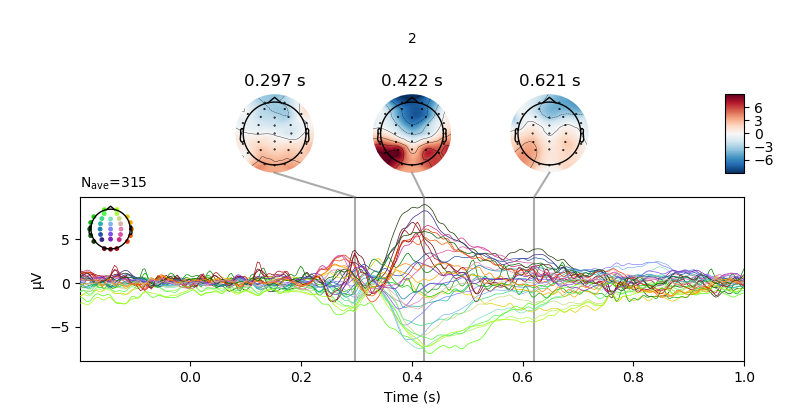

<IPython.core.display.Javascript object>


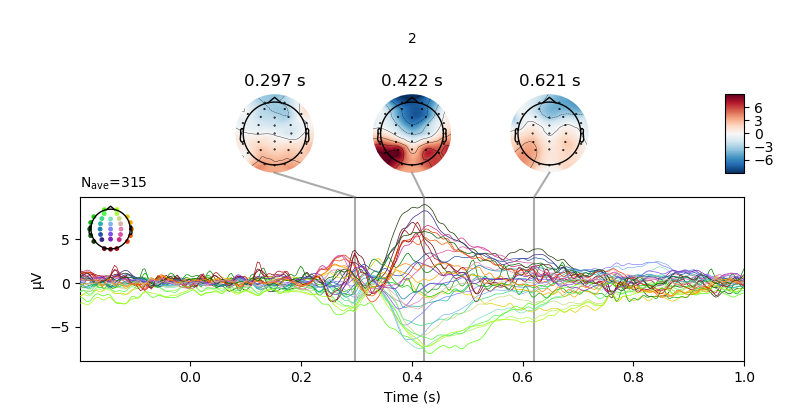

In [37]:
all_evokeds[1].plot_joint(title=2)

### Observed P1,N1,P2,N2,P3

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/evoked.py:300: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(len(ch_types_used), 1)


<IPython.core.display.Javascript object>


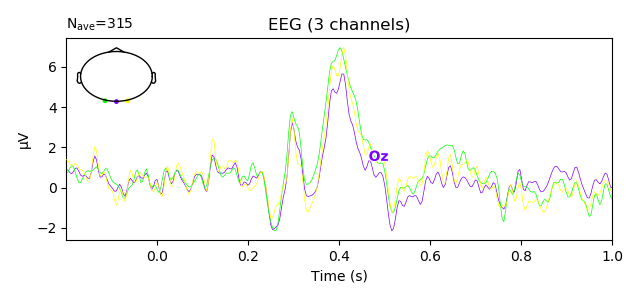

<IPython.core.display.Javascript object>


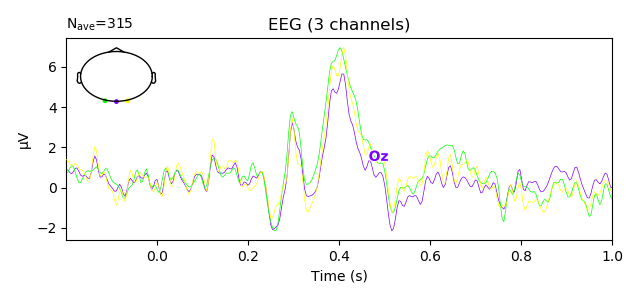

In [45]:
all_evokeds[1].plot(picks=['Oz','O1','O2'],spatial_colors=True)

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/evoked.py:300: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(len(ch_types_used), 1)


<IPython.core.display.Javascript object>


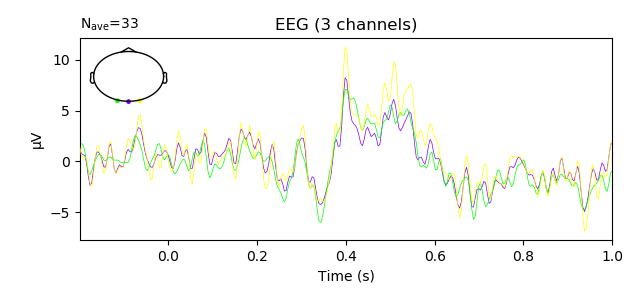

<IPython.core.display.Javascript object>


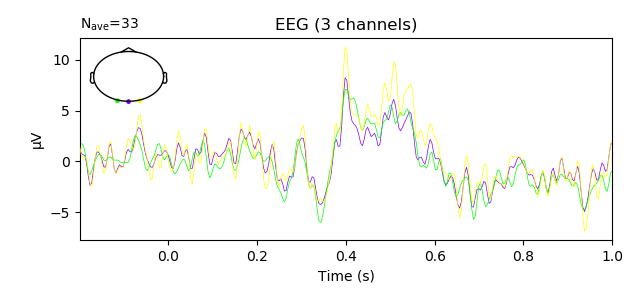

In [46]:
all_evokeds[0].plot(picks=['Oz','O1','O2'],spatial_colors=True)

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/evoked.py:300: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(len(ch_types_used), 1)


<IPython.core.display.Javascript object>


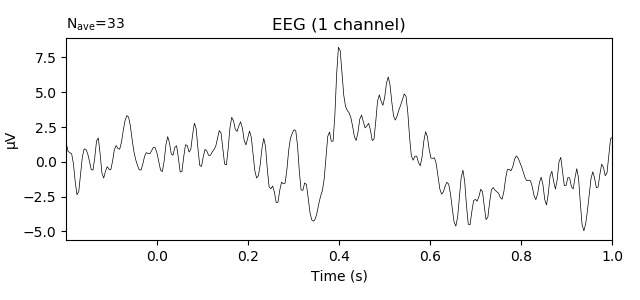

Need more than one channel to make topography for eeg. Disabling interactivity.


<IPython.core.display.Javascript object>


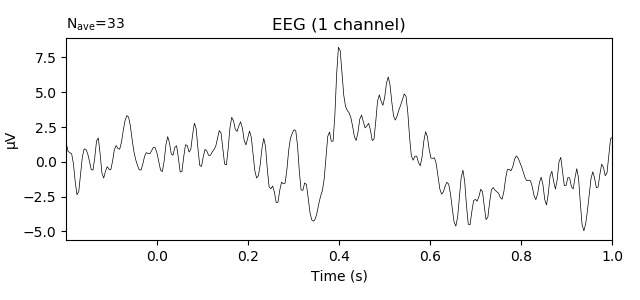

In [47]:
all_evokeds[0].plot(picks=['Oz'])

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/evoked.py:300: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(len(ch_types_used), 1)


<IPython.core.display.Javascript object>


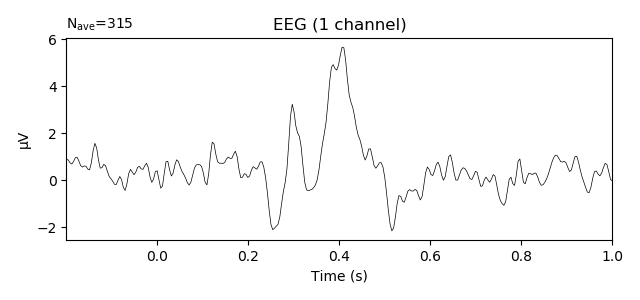

Need more than one channel to make topography for eeg. Disabling interactivity.


<IPython.core.display.Javascript object>


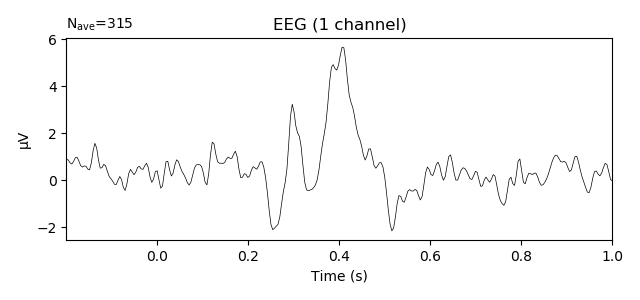

In [48]:
all_evokeds[1].plot(picks=['Oz'])

In [49]:
l=[reconst_epochs['1'].average(),reconst_epochs['2'].average()]

In [50]:
reconst_epochs['1'].average()

<Evoked  |  '1' (average, N=33), [-0.19922, 1] sec, 32 ch, ~168 kB>

In [51]:
l[0]._data.shape

(32, 308)

In [52]:
x=np.mean(l[0]._data,axis=0)

In [53]:
x

array([ 4.85928042e-12,  5.82356469e-12,  6.45651051e-12,  4.51523617e-12,
        4.74796254e-12,  4.94120835e-12,  5.50715615e-12, -2.09829331e-13,
        9.47159727e-13,  6.61640429e-13,  3.13096397e-12,  2.61485613e-12,
        3.26013457e-12, -5.90875419e-13,  1.78405702e-12, -5.97957670e-13,
       -7.03090373e-13, -2.38038361e-12, -1.70754292e-12, -1.22506306e-12,
       -3.57202229e-12, -1.52410785e-12, -4.24209764e-12, -5.63907550e-12,
       -3.09271141e-12, -1.85106319e-12, -4.84634329e-12,  1.41145586e-12,
       -1.47057165e-12, -1.09977680e-12, -3.39089708e-12, -5.56384303e-12,
       -1.07909328e-12,  1.15670842e-12, -1.89120752e-12, -4.53482550e-12,
       -1.75017448e-12, -2.96903549e-12, -1.07405224e-12, -1.75883562e-12,
       -3.03050161e-12, -3.59397413e-12, -5.62837562e-12, -3.93165336e-12,
       -3.77593719e-12, -1.27621498e-12, -1.62443105e-12, -3.54586949e-12,
       -1.04753307e-13,  1.46346079e-12,  6.88815588e-12,  6.98317824e-13,
       -7.25087229e-13, -

In [55]:
x.shape

(308,)

In [54]:
x_std=np.std(l[0]._data,axis=0)

In [56]:
x_std

array([1.57561201e-06, 1.37398777e-06, 1.07344032e-06, 7.46350885e-07,
       5.15154581e-07, 7.01543503e-07, 1.03835947e-06, 1.11579545e-06,
       9.73633504e-07, 8.56876344e-07, 7.63532015e-07, 8.65450317e-07,
       8.73990987e-07, 5.42015777e-07, 5.42772727e-07, 5.54001105e-07,
       5.19310825e-07, 9.41247767e-07, 1.20290131e-06, 1.24245891e-06,
       1.33843600e-06, 1.51039970e-06, 1.54464183e-06, 1.43058027e-06,
       1.08425097e-06, 5.87234917e-07, 6.53120049e-07, 7.53122832e-07,
       7.41466972e-07, 8.44473410e-07, 8.84943034e-07, 1.06785665e-06,
       1.34754806e-06, 1.62117753e-06, 1.78329005e-06, 1.65590910e-06,
       1.35013216e-06, 1.09092268e-06, 9.52444967e-07, 9.39585813e-07,
       1.04063756e-06, 1.04068848e-06, 7.70039064e-07, 8.96936272e-07,
       1.30187353e-06, 1.30515892e-06, 1.17041067e-06, 1.07763829e-06,
       9.33531557e-07, 9.89527450e-07, 9.32209106e-07, 8.14312381e-07,
       9.43350342e-07, 1.01945970e-06, 1.20515635e-06, 1.29711147e-06,
      

In [60]:
x2=np.mean(l[1]._data,axis=0)
x2.shape

(308,)

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


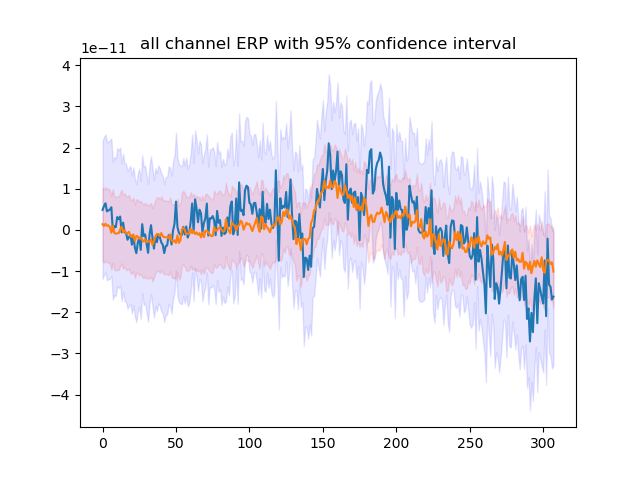

In [61]:
#some example data
t= np.arange(308)
#x1=l[0]._data
#x2=l[1]._data
#y = 3.0 * x
#some confidence interval
ci = 1.96 * np.std(x,axis=0)#/np.mean(x1,axis=0)
ci2 = 1.96 * np.std(x2,axis=0)#/np.mean(x2,axis=0)

fig, ax = plt.subplots()
plt.title('all channel ERP with 95% confidence interval')
ax.plot(t,x,label='cat')
ax.plot(t,x2,label='noncat')
ax.fill_between(t, (x-ci), (x+ci), color='b', alpha=.1)
ax.fill_between(t, (x2-ci2), (x2+ci2), color='r', alpha=.1)

## Time frequency spectrogram
### Target: cat
https://mne.tools/stable/auto_tutorials/time-freq/plot_sensors_time_frequency.html#sphx-glr-auto-tutorials-time-freq-plot-sensors-time-frequency-py

In [62]:
from mne.time_frequency import tfr_morlet

In [141]:
# define frequencies of interest (log-spaced)
freqs = np.logspace(*np.log10([0.5, 51.2]), num=20)
n_cycles = freqs / 2.  # different number of cycle per frequency
power, itc = tfr_morlet(reconst_epochs['1'], freqs=freqs, n_cycles=n_cycles, use_fft=True,
                        return_itc=True, decim=3, n_jobs=1)

In [142]:
reconst_epochs['1'].info

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, AF3, AF4, F7, F3, Fz, F4, F8, FT7, FC3, FCz, FC4, FT8, ...
 chs: 32 EEG
 custom_ref_applied: True
 dig: 32 items (32 EEG)
 highpass: 1.0 Hz
 lowpass: 51.2 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 256.0 Hz
>

In [127]:
power.info

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, AF3, AF4, F7, F3, Fz, F4, F8, FT7, FC3, FCz, FC4, FT8, ...
 chs: 32 EEG
 custom_ref_applied: True
 dig: 32 items (32 EEG)
 highpass: 1.0 Hz
 lowpass: 51.2 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 85.3 Hz
>

In [128]:
power.info['ch_names']

['Fp1',
 'Fp2',
 'AF3',
 'AF4',
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'FT7',
 'FC3',
 'FCz',
 'FC4',
 'FT8',
 'T7',
 'C3',
 'Cz',
 'C4',
 'T8',
 'TP7',
 'CP3',
 'CPz',
 'CP4',
 'TP8',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'O1',
 'Oz',
 'O2']

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/topo.py:213: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


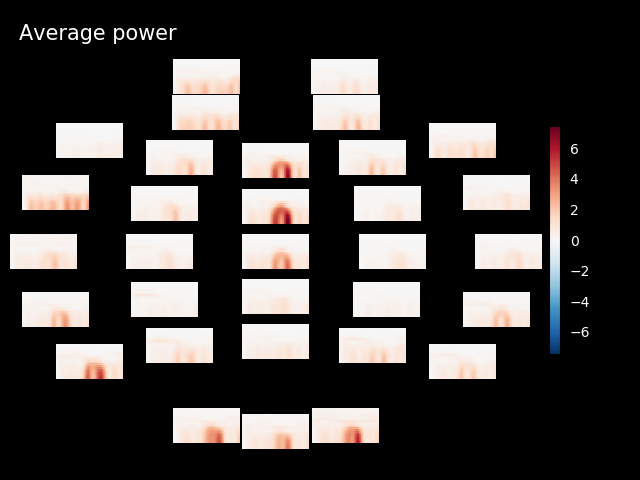

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/time_frequency/tfr.py:1255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


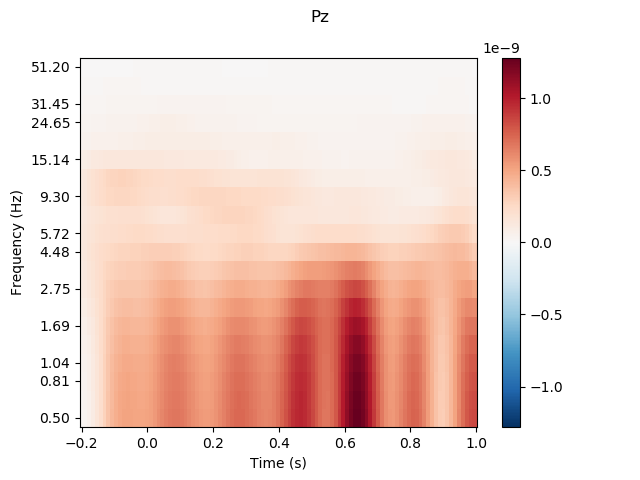

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


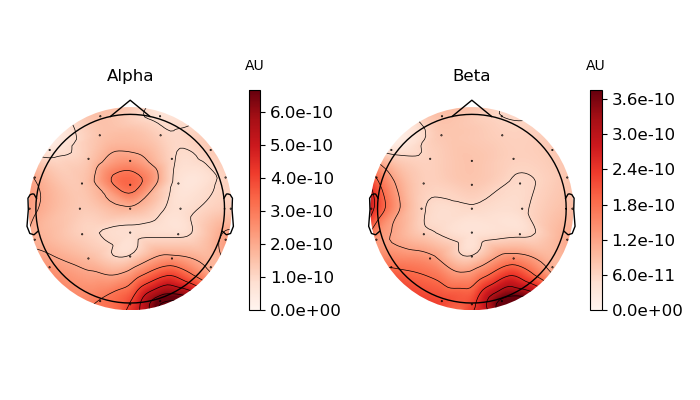

No baseline correction applied
No baseline correction applied


In [130]:
power.plot_topo(mode='logratio', title='Average power')# baseline=(-0.5, 0), 
power.plot([26], mode='logratio', title=power.ch_names[26])# , baseline=(-0.5, 0)

fig, axis = plt.subplots(1, 2, figsize=(7, 4))
power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=8, fmax=12,
                    mode='logratio', axes=axis[0],
                   title='Alpha', show=False)# baseline=(-0.5, 0),
power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=13, fmax=25,
                   mode='logratio', axes=axis[1],
                   title='Beta', show=False)# baseline=(-0.5, 0), 
mne.viz.tight_layout()
plt.show()

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/topo.py:213: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


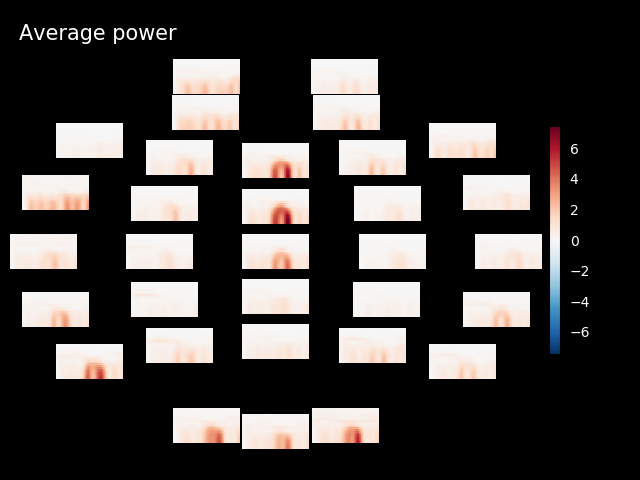

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/time_frequency/tfr.py:1255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


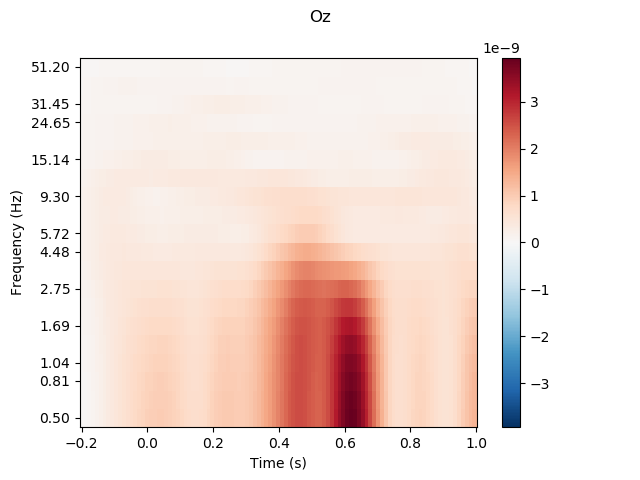

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


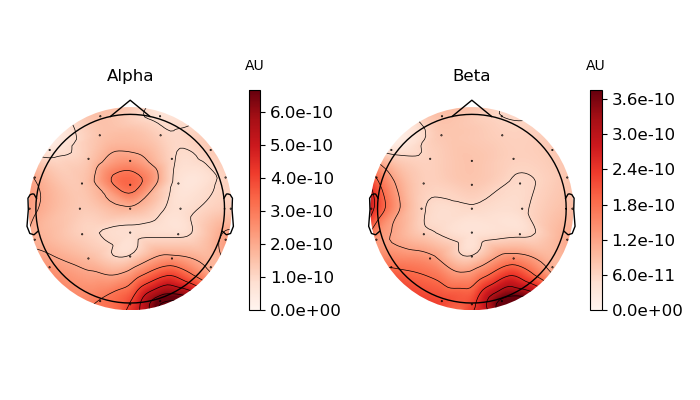

No baseline correction applied
No baseline correction applied


In [131]:
power.plot_topo(mode='logratio', title='Average power')# baseline=(-0.5, 0), 
power.plot([30], mode='logratio', title=power.ch_names[30])# , baseline=(-0.5, 0)

fig, axis = plt.subplots(1, 2, figsize=(7, 4))
power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=8, fmax=12,
                    mode='logratio', axes=axis[0],
                   title='Alpha', show=False)# baseline=(-0.5, 0),
power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=13, fmax=25,
                   mode='logratio', axes=axis[1],
                   title='Beta', show=False)# baseline=(-0.5, 0), 
mne.viz.tight_layout()
plt.show()

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/topo.py:213: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


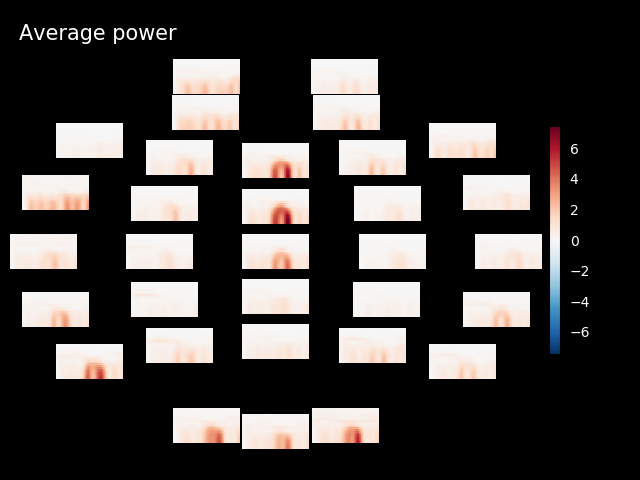

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/time_frequency/tfr.py:1255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


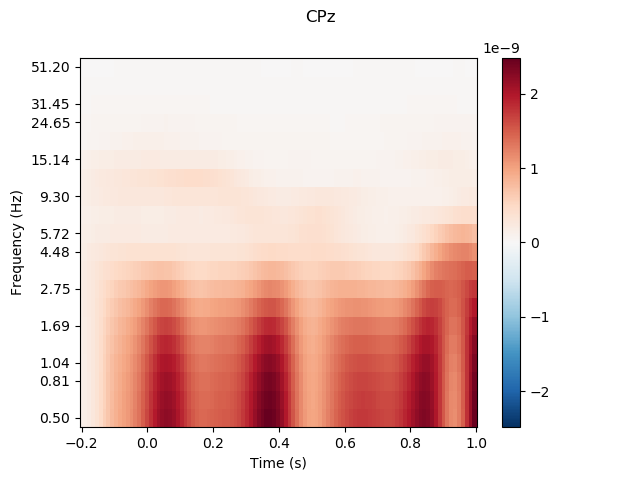

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


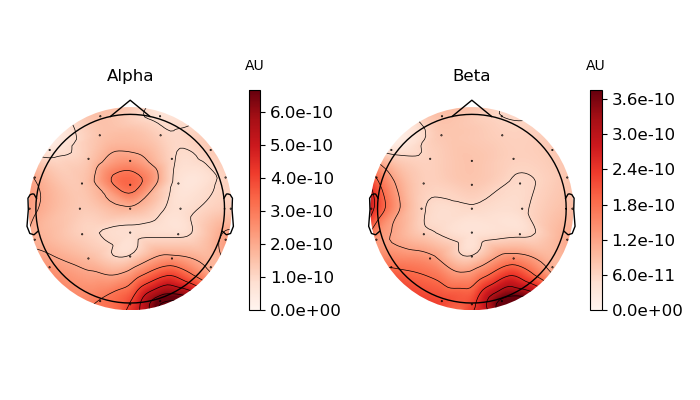

No baseline correction applied
No baseline correction applied


In [132]:
power.plot_topo(mode='logratio', title='Average power')# baseline=(-0.5, 0), 
power.plot([0], mode='logratio', title=power.ch_names[21])# , baseline=(-0.5, 0)

fig, axis = plt.subplots(1, 2, figsize=(7, 4))
power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=8, fmax=12,
                    mode='logratio', axes=axis[0],
                   title='Alpha', show=False)# baseline=(-0.5, 0),
power.plot_topomap(ch_type='eeg', tmin=0.5, tmax=1.5, fmin=13, fmax=25,
                   mode='logratio', axes=axis[1],
                   title='Beta', show=False)# baseline=(-0.5, 0), 
mne.viz.tight_layout()
plt.show()

## Plot TFRs as a two-dimensional image with topomaps.
TFR: Time frequency representation
mode:  
Do baseline correction with ratio (power is divided by mean power during baseline) or zscore (power is divided by standard deviation of power during baseline after subtracting the mean, power = [power - mean(power_baseline)] / std(power_baseline)), mean simply subtracts the mean power, percent is the same as applying ratio then mean, logratio is the same as mean but then rendered in log-scale, zlogratio is the same as zscore but data is rendered in log-scale first. If None no baseline correction is applied.  
https://mne.tools/stable/generated/mne.time_frequency.AverageTFR.html#mne.time_frequency.AverageTFR.plot_joint

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


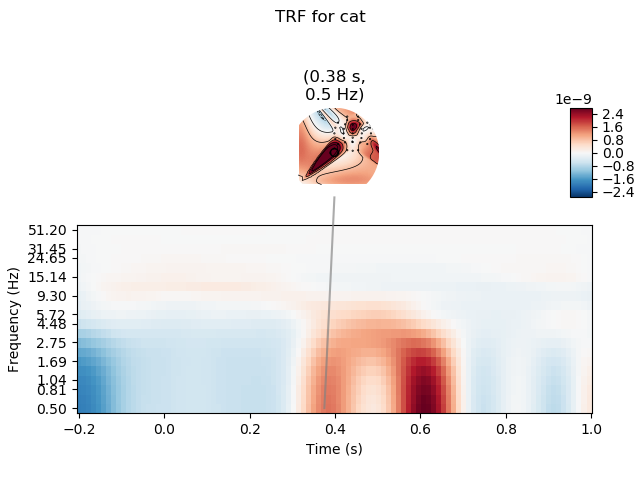

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


<IPython.core.display.Javascript object>


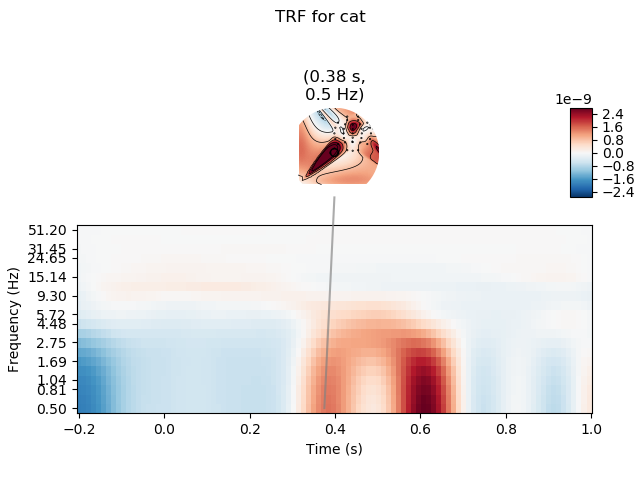

In [143]:
# baseline
power.plot_joint(baseline=(-0.2, 1), mode='mean', tmin=-0.2, tmax=1,title='TRF for cat')# ,timefreqs=[(.5, 10), (1.3, 8)]

No baseline correction applied


<IPython.core.display.Javascript object>


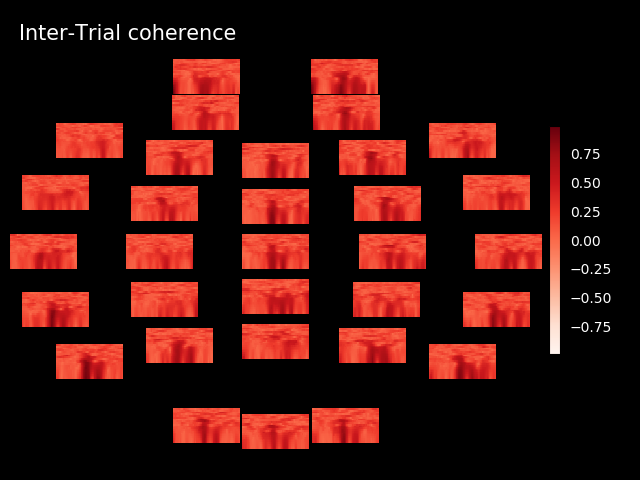

<IPython.core.display.Javascript object>


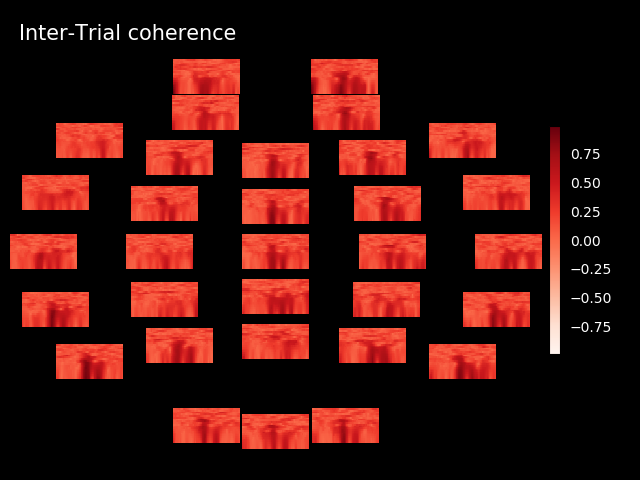

In [136]:
itc.plot_topo(title='Inter-Trial coherence', cmap='Reds')

### Nontarget: noncat

In [137]:
# define frequencies of interest (log-spaced)
freqs = np.logspace(*np.log10([0.5, 51.2]), num=20)
n_cycles = freqs / 2.  # different number of cycle per frequency
power, itc = tfr_morlet(reconst_epochs['2'], freqs=freqs, n_cycles=n_cycles, use_fft=True,
                        return_itc=True, decim=3, n_jobs=1)

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/utils.py:1928: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


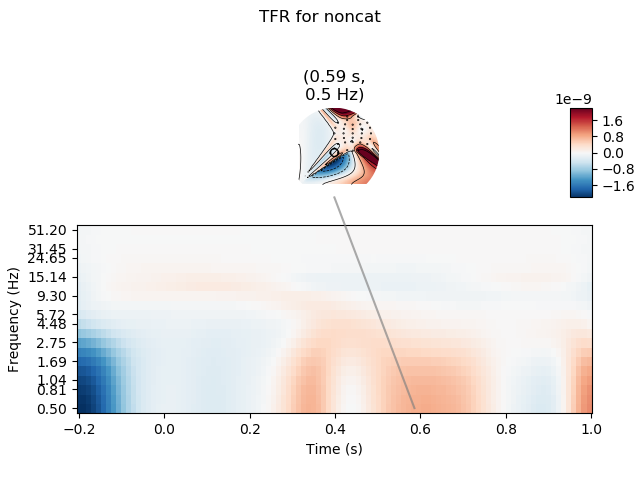

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


<IPython.core.display.Javascript object>


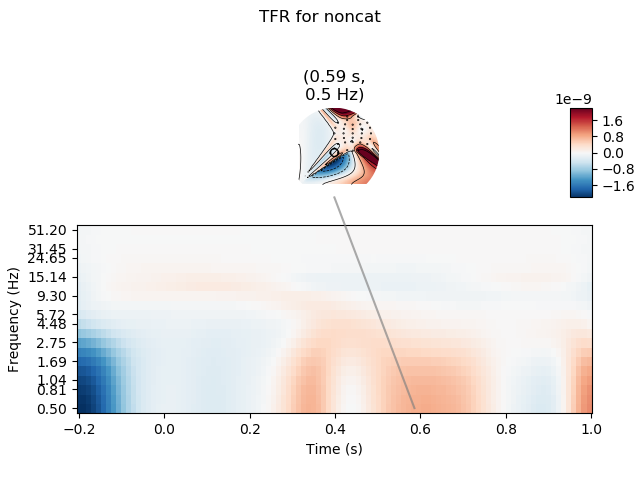

In [140]:
# baseline
power.plot_joint(baseline=(-0.2, 1), mode='mean', tmin=-0.2, tmax=1,title='TFR for noncat')# ,timefreqs=[(.5, 10), (1.3, 8)]

No baseline correction applied


/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/mne/viz/topo.py:213: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


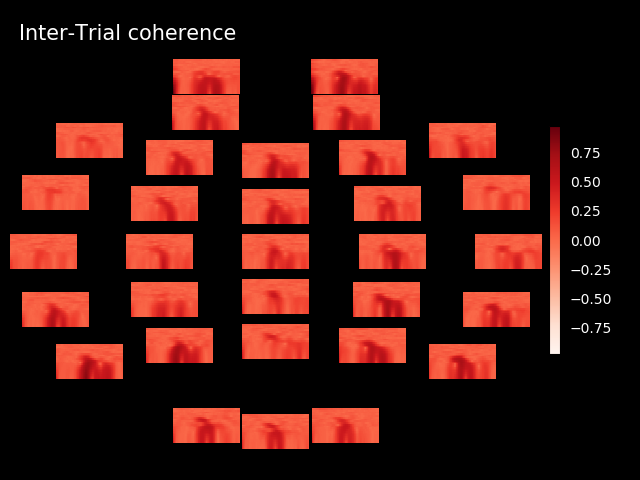

<IPython.core.display.Javascript object>


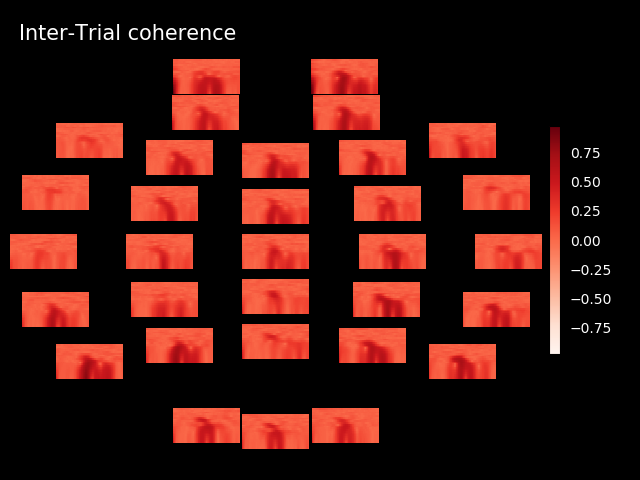

In [139]:
itc.plot_topo(title='Inter-Trial coherence', cmap='Reds')

## EEGnet

In [58]:
import numpy as np

# mne imports
import mne
from mne import io
#from mne.datasets import sample

# EEGNet-specific imports
from EEGModels import EEGNet
from tensorflow.keras import utils as np_utils
from tensorflow.keras.callbacks import ModelCheckpoint

# PyRiemann imports
from pyriemann.estimation import XdawnCovariances
from pyriemann.tangentspace import TangentSpace
from pyriemann.utils.viz import plot_confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression

# tools for plotting confusion matrices
from matplotlib import pyplot as plt

/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/dollars9256741/.conda/envs/env_demo/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/dollars9256741/.con

In [59]:
labels = reconst_epochs.events[:, -1]

In [60]:
labels

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2,
       2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2,

In [61]:
# extract raw data. scale by 1000 due to scaling sensitivity in deep learning
X = reconst_epochs.get_data()*1000 # format is in (trials, channels, samples)
y = labels

In [62]:
X.shape

(348, 32, 308)

In [107]:
kernels, chans, samples = 1, 32, 308

# take 50/25/25 percent of the data to train/validate/test
X_train      = X[0:174,]
Y_train      = y[0:174]
X_validate   = X[174:261,]
Y_validate   = y[174:261]
X_test       = X[261:,]
Y_test       = y[261:]

In [108]:
############################# EEGNet portion ##################################

# convert labels to one-hot encodings.
Y_train      = np_utils.to_categorical(Y_train-1)
Y_validate   = np_utils.to_categorical(Y_validate-1)
Y_test       = np_utils.to_categorical(Y_test-1)

# convert data to NCHW (trials, kernels, channels, samples) format. Data 
# contains 32 channels and 308 time-points. Set the number of kernels to 1.
X_train      = X_train.reshape(X_train.shape[0], chans, samples, kernels)
X_validate   = X_validate.reshape(X_validate.shape[0], chans, samples, kernels)
X_test       = X_test.reshape(X_test.shape[0], chans, samples, kernels)
   
print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

X_train shape: (174, 32, 308, 1)
174 train samples
87 test samples


In [146]:
import pickle
with open('./data/minjiun/valid_data.pickle','wb') as file:
    pickle.dump(X_validate,file)
file.close()

In [128]:
# configure the EEGNet-8,2,16 model with kernel length of 32 samples (other 
# model configurations may do better, but this is a good starting point)
model = EEGNet(nb_classes = 2, Chans = chans, Samples = samples, 
               dropoutRate = 0.5, kernLength = 32, F1 = 8, D = 2, F2 = 16, 
               dropoutType = 'Dropout')

In [129]:
# compile the model and set the optimizers
model.compile(loss='categorical_crossentropy', optimizer='adam', 
              metrics = ['accuracy'])

# count number of parameters in the model
numParams    = model.count_params()    

# set a valid path for your system to record model checkpoints
checkpointer = ModelCheckpoint(filepath='eegnet_0630.h5', verbose=1,
                               save_best_only=True)

In [111]:
reconst_epochs

<Epochs  |   348 events (all good), -0.199219 - 1 sec, baseline [-0.2, 0], ~26.3 MB, data loaded,
 '1': 33
 '2': 315>

In [112]:
class_weights = {0:33/348, 1:315/348}

In [113]:
X_test.shape

(87, 32, 308, 1)

In [130]:
fittedModel = model.fit(X_train, Y_train, batch_size = 3, epochs = 300, 
                        verbose = 2, validation_data=(X_validate, Y_validate),
                        callbacks=[checkpointer], class_weight = class_weights)

Train on 174 samples, validate on 87 samples
Epoch 1/300

Epoch 00001: val_loss improved from inf to 0.56425, saving model to eegnet_0630.h5
174/174 - 2s - loss: 0.3584 - acc: 0.8678 - val_loss: 0.5643 - val_acc: 0.8851
Epoch 2/300

Epoch 00002: val_loss improved from 0.56425 to 0.43504, saving model to eegnet_0630.h5
174/174 - 1s - loss: 0.1254 - acc: 0.9023 - val_loss: 0.4350 - val_acc: 0.8851
Epoch 3/300

Epoch 00003: val_loss improved from 0.43504 to 0.36638, saving model to eegnet_0630.h5
174/174 - 1s - loss: 0.0721 - acc: 0.9023 - val_loss: 0.3664 - val_acc: 0.8851
Epoch 4/300

Epoch 00004: val_loss improved from 0.36638 to 0.35986, saving model to eegnet_0630.h5
174/174 - 1s - loss: 0.0602 - acc: 0.9023 - val_loss: 0.3599 - val_acc: 0.8851
Epoch 5/300

Epoch 00005: val_loss did not improve from 0.35986
174/174 - 1s - loss: 0.0580 - acc: 0.9023 - val_loss: 0.3820 - val_acc: 0.8851
Epoch 6/300

Epoch 00006: val_loss did not improve from 0.35986
174/174 - 1s - loss: 0.0544 - acc: 0

In [131]:
# load optimal weights
model.load_weights('eegnet_0630.h5')

In [116]:
from sklearn.metrics import roc_auc_score,accuracy_score,balanced_accuracy_score

In [132]:
###############################################################################
# make prediction on test set.
###############################################################################

probs = model.predict(X_test)
preds = np.argmax(probs,axis=1)
true=Y_test.argmax(axis=-1) 
acc = accuracy_score(true,preds)
bal_acc=balanced_accuracy_score(true,preds)
auc = roc_auc_score(true, preds,average='weighted')
print("Classification accuracy: %f " % (acc))
print("Classification balanced accuracy: %f " % (bal_acc))
print("Classification AUC: %f " % (auc))

Classification accuracy: 0.942529 
Classification balanced accuracy: 0.583333 
Classification AUC: 0.583333 


In [133]:
len(Y_test)

87

In [134]:
np.sum(Y_test,axis=0)

array([ 6., 81.], dtype=float32)

In [121]:
33/315

0.10476190476190476

In [122]:
6/87

0.06896551724137931

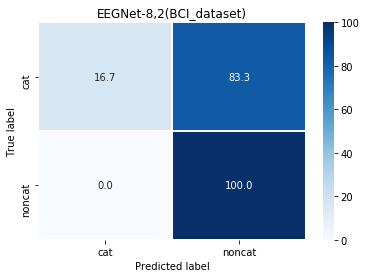

In [135]:
############################# PyRiemann Portion ##############################

# plot the confusion matrices for both classifiers
names = ['cat', 'noncat']
plt.figure(0)
plot_confusion_matrix(true,preds,names,title = 'EEGNet-8,2(BCI_dataset)')

In [136]:
# configure the EEGNet-4,2,16 model with kernel length of 32 samples (other 
# model configurations may do better, but this is a good starting point)
model = EEGNet(nb_classes = 2, Chans = chans, Samples = samples, 
               dropoutRate = 0.5, kernLength = 32, F1 = 4, D = 2, F2 = 8, 
               dropoutType = 'Dropout')

In [137]:
# compile the model and set the optimizers
model.compile(loss='categorical_crossentropy', optimizer='adam', 
              metrics = ['accuracy'])

# count number of parameters in the model
numParams    = model.count_params()    

# set a valid path for your system to record model checkpoints
checkpointer = ModelCheckpoint(filepath='eegnet4-2_0630.h5', verbose=1,
                               save_best_only=True)

In [138]:
fittedModel = model.fit(X_train, Y_train, batch_size = 3, epochs = 300, 
                        verbose = 2, validation_data=(X_validate, Y_validate),
                        callbacks=[checkpointer], class_weight = class_weights)

Train on 174 samples, validate on 87 samples
Epoch 1/300

Epoch 00001: val_loss improved from inf to 0.59922, saving model to eegnet4-2_0630.h5
174/174 - 2s - loss: 0.4386 - acc: 0.8678 - val_loss: 0.5992 - val_acc: 0.8851
Epoch 2/300

Epoch 00002: val_loss improved from 0.59922 to 0.48759, saving model to eegnet4-2_0630.h5
174/174 - 1s - loss: 0.2261 - acc: 0.9023 - val_loss: 0.4876 - val_acc: 0.8851
Epoch 3/300

Epoch 00003: val_loss improved from 0.48759 to 0.41267, saving model to eegnet4-2_0630.h5
174/174 - 1s - loss: 0.1494 - acc: 0.9023 - val_loss: 0.4127 - val_acc: 0.8851
Epoch 4/300

Epoch 00004: val_loss improved from 0.41267 to 0.36427, saving model to eegnet4-2_0630.h5
174/174 - 1s - loss: 0.1029 - acc: 0.9023 - val_loss: 0.3643 - val_acc: 0.8851
Epoch 5/300

Epoch 00005: val_loss improved from 0.36427 to 0.36004, saving model to eegnet4-2_0630.h5
174/174 - 1s - loss: 0.0739 - acc: 0.9023 - val_loss: 0.3600 - val_acc: 0.8851
Epoch 6/300

Epoch 00006: val_loss did not improv

In [139]:
###############################################################################
# make prediction on test set.
###############################################################################

probs = model.predict(X_test)
preds = np.argmax(probs,axis=1)
true=Y_test.argmax(axis=-1) 
acc = accuracy_score(true,preds)
bal_acc=balanced_accuracy_score(true,preds)
auc = roc_auc_score(true, preds,average='weighted')
print("Classification accuracy: %f " % (acc))
print("Classification balanced accuracy: %f " % (bal_acc))
print("Classification AUC: %f " % (auc))

Classification accuracy: 0.931034 
Classification balanced accuracy: 0.500000 
Classification AUC: 0.500000 


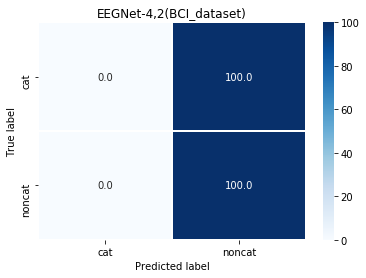

In [140]:
############################# PyRiemann Portion ##############################

# plot the confusion matrices for both classifiers
names = ['cat', 'noncat']
plt.figure(0)
plot_confusion_matrix(true,preds,names,title = 'EEGNet-4,2(BCI_dataset)')